In [1]:
import os
import numpy as np
import pandas as pd
import ast
from scipy.stats import iqr,yeojohnson, skew, kurtosis
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import missingno as msno

import regex as re
import eda_helper_functions
import matplotlib.gridspec as gridspec
import scipy.stats as stats
from collections import defaultdict
from scipy.stats import ttest_ind

from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from feature_engine.encoding import RareLabelEncoder
import category_encoders as ce
from sklearn.utils import Tags
from sklearn.feature_selection import f_regression
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer

import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.experimental import enable_iterative_imputer  
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, mutual_info_regression, RFE
from sklearn.ensemble import IsolationForest, RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
import optuna
import numpy as np
from sklearn.preprocessing import FunctionTransformer
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# Instead of getting output as NumPy array, get it as a pandas DataFrame
from sklearn import set_config
set_config(transform_output="pandas")

In [3]:
df = pd.read_csv('3rd_after_multivariate_analysis_dataset.csv')

In [4]:
df.shape

(11879, 179)

In [5]:
#let's see if our dataset contains missing values.

df.isna().sum().sum()

1551118

In [6]:
# percentage of rows in the data having missing value

(df.isna().any(axis=1).sum() / df.shape[0]) * 100

100.0

`observation`
- 1551118 is a big number that tells us there are a lot of missing values in dataset
- all rows have atleast one or more than one missing values 

# User-Defined Functions

In [7]:
def null_features(df):
    # Prepare dataset EDA values
    summary = pd.DataFrame(df.dtypes, columns=['dtypes']).reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]

    # Function to safely count uniques, ignoring columns with unhashable types (like lists)
    def safe_nunique(col):
        try:
            return col.nunique()
        except TypeError:
            return None  # or np.nan if you prefer

    # Calculate uniques with safe check
    summary['Uniques'] = summary['Name'].apply(lambda col_name: safe_nunique(df[col_name]))
    summary['Null'] = df.isna().sum().values
    summary['Null(%)'] = round((summary['Null'] / len(df) * 100), 1).astype(str) + '%'

    # Add a column to indicate whether the feature has missing values
    summary['Has Null'] = summary['Null'] > 0

    # Sort by Null count (descending) and Name (ascending)
    summary = summary.sort_values(by=['Null', 'Name'], ascending=[False, True]).reset_index(drop=True)
    summary.index = range(1, len(summary) + 1)

    return summary


`Null value analysis`

In [8]:
# Null Values Analysis
def null_features(data):
    # Prepare dataset EDA values
    summary = pd.DataFrame(data.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Uniques'] = data.nunique().values
    summary['Null'] = data.isna().sum().values
    summary['Null(%)'] = round((summary['Null'] / len(data) * 100), 1).astype(str) + '%'
    
    # Add a column to indicate whether the feature has missing values
    summary['Has Null'] = summary['Null'] > 0

    # Sort by Null count (descending) and Name (ascending)
    summary = summary.sort_values(by=['Null', 'Name'], ascending=[False, True])
    summary.index = range(1, len(summary) + 1)
    
    return summary

# Example usage
#null_summary = null_features(data)
#print(null_summary)

`Categorization of Hidden Patterns in Missing Data Using Correlation Matrix Analysis`

In [9]:
def categorize_missingness(corr_matrix):
    categories = {
        "exact 1.00 means always Missing Together": defaultdict(list),
        "less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together": defaultdict(list),
        "less than 0.7 but greater than equal to 0.4 means moderately Related Missingness": defaultdict(list),
        "less than 0.4 but greater than equal to 0.1 means occasionally Missing Together": defaultdict(list),
        "less than -0.7 means one Present, one Always Missing": defaultdict(list),
        "less than -0.4 but greater than equal to -0.7 means highly Opposite Missingness": defaultdict(list),
        "less than -0.1 but greater than equal to -0.4 means slightly Opposite Missingness": defaultdict(list),
        "between -0.1 and 0.1 means unrelated Missingness": defaultdict(list)
    }

    processed_pairs = set()

    for col in corr_matrix.columns:
        for index, corr_value in corr_matrix[col].items():
            if col != index and (index, col) not in processed_pairs:
                processed_pairs.add((col, index))  # Mark as processed to avoid duplicates

                if corr_value == 1.0:
                    categories["exact 1.00 means always Missing Together"][col].append(index)
                elif corr_value >= 0.7:
                    categories["less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together"][col].append(index)
                elif corr_value >= 0.4:
                    categories["less than 0.7 but greater than equal to 0.4 means moderately Related Missingness"][col].append(index)
                elif corr_value >= 0.1:
                    categories["less than 0.4 but greater than equal to 0.1 means occasionally Missing Together"][col].append(index)
                elif corr_value <= -0.7:
                    categories["less than -0.7 means one Present, one Always Missing"][col].append(index)
                elif corr_value <= -0.4:
                    categories["less than -0.4 but greater than equal to -0.7 means highly Opposite Missingness"][col].append(index)
                elif corr_value <= -0.1:
                    categories["less than -0.1 but greater than equal to -0.4 means slightly Opposite Missingness"][col].append(index)
                else:
                    categories["between -0.1 and 0.1 means unrelated Missingness"][col].append(index)

    return categories

# Compute missing value correlation matrix
missing_corr_matrix = df.isnull().corr()

`t-tests on specific variables test`

In [10]:
def analyze_missing_column(X_train, column):
    """Analyzes missing vs. non-missing groups for a given column and sorts absolute differences."""
    
    # Split data
    missing_data = X_train[X_train[column].isnull()]
    not_missing_data = X_train[~X_train[column].isnull()]
    
    # Calculate means for numeric columns
    means_missing = missing_data.select_dtypes(include=['number']).mean()
    means_not_missing = not_missing_data.select_dtypes(include=['number']).mean()
    
    # Compute absolute differences
    mean_differences = abs(means_missing - means_not_missing)
    
    # Sort differences in descending order
    sorted_differences = mean_differences.sort_values(ascending=False)
    
    print(f"Means with '{column}' missing:\n", means_missing)
    print(f"\nMeans without '{column}' missing:\n", means_not_missing)
    print(f"\nAbsolute Differences (Sorted):\n", sorted_differences)

# Example Usage
# analyze_missing_column(X_train, 'parking')

In [11]:
def analyze_missing_column_with_predictors(X_train, column, test_columns, alpha=0.05):
    """Performs t-tests between missing and non-missing groups using up to 4 predictor columns."""
    
    # Split data
    missing_data = X_train[X_train[column].isnull()]
    not_missing_data = X_train[~X_train[column].isnull()]
    
    for test_col in test_columns:
        if test_col in X_train.columns:
            t_stat, p_val = ttest_ind(
                missing_data[test_col], not_missing_data[test_col], 
                equal_var=False, nan_policy='omit'
            )
            print(f"\nT-test for {test_col}:")
            print(f"T-statistic: {t_stat}, P-value: {p_val}")
            
            if p_val < alpha:
                print(f"{test_col} is significantly different between missing and non-missing groups of '{column}', so '{column}' is likely MAR.")
            else:
                print(f"{test_col} is NOT significantly different, so '{column}' is likely MCAR.")
        else:
            print(f"\nWarning: Column '{test_col}' not found in dataset.")

# Analyze parking column with 4 predictor variables
# analyze_missing_column_with_predictors(X_train, 'parking', ['area', 'locality_rank', 'costpersqft', 'bed'])

`Little’s MCAR Test`

In [12]:
def littles_mcar_test(data):
    """Performs Little's MCAR test on numerical columns."""
    data = data.select_dtypes(include=['number']).copy()  # Keep only numerical features
    
    # Drop rows where all numerical values are missing
    data.dropna(how="all", inplace=True)

    # Create a binary missing indicator for each column
    missing_mask = data.isnull().astype(int)

    # Compute means for each missing group
    chi_square = 0
    df = 0
    for col in data.columns:
        grouped_means = data.groupby(missing_mask[col]).mean()
        
        # Ensure there are at least two groups (0: not missing, 1: missing)
        if grouped_means.shape[0] < 2:
            continue
        
        observed = grouped_means.iloc[0].values  # Mean of non-missing group
        expected = grouped_means.iloc[1].values  # Mean of missing group

        # Compute chi-square statistic, avoiding division by zero
        chi_square += np.nansum((observed - expected) ** 2 / (expected + 1e-10))  
        df += len(observed)

    p_value = 1 - stats.chi2.cdf(chi_square, df)

    return chi_square, p_value

`missing info`

In [13]:
# missing values with type filter
def missing_info(data, dtype='all'):
    if dtype == 'numeric':
        data = data.select_dtypes(include='number')
    elif dtype == 'categorical':
        data = data.select_dtypes(exclude='number')

    na_cols = [col for col in data.columns if data[col].isna().any()]
    na_counts = [data[col].isna().sum() for col in na_cols]
    na_pct = [(data[col].isna().mean() * 100) for col in na_cols]

    return (
        pd.DataFrame(data={
            "variable": na_cols,
            "count": na_counts,
            "percentage": na_pct
        })
        .sort_values(by="count", ascending=False)
        .set_index("variable")
    )
    
#Usage:
#missing_info(df) → all columns with missing values
#missing_info(df, dtype='numeric') → only numeric columns
#missing_info(df, dtype='categorical') → only categorical columns

`Automatic skewness-based feature transformation for improved normality.`

In [14]:
class SkewnessTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, power_transform_method='yeo-johnson'):
        self.applied_transform_ = None
        self.power_transformer_ = None
        self.power_transform_method = power_transform_method  # 'box-cox' or 'yeo-johnson'

    def fit(self, X, y=None):
        if isinstance(X, np.ndarray):
            X_df = pd.DataFrame(X, columns=['col'])
        else:
            X_df = X

        skewness = X_df.skew().iloc[0]
        self.skewness_ = skewness

        if abs(skewness) > 1:
            # Use power transform for strong skewness (positive or negative)
            self.applied_transform_ = 'power_transform'
            self.power_transformer_ = PowerTransformer(method=self.power_transform_method)
            self.power_transformer_.fit(X_df.values.reshape(-1, 1))
        else:
            # For mild/moderate skewness, apply manual transforms
            if 0.5 < skewness <= 1:
                self.applied_transform_ = 'sqrt'
            elif 0 < skewness <= 0.5:
                self.applied_transform_ = 'log1p'
            elif -1 < skewness <= -0.5:
                self.applied_transform_ = 'reflect + sqrt'
            elif -0.5 < skewness < 0:
                self.applied_transform_ = 'square'
            elif skewness <= -1:
                self.applied_transform_ = 'reflect + log1p'
            else:
                self.applied_transform_ = 'none'

        return self

    def transform(self, X):
        if isinstance(X, np.ndarray):
            X_df = pd.DataFrame(X, columns=['col'])
        else:
            X_df = X.copy()

        col = X_df.columns[0]
        x = X_df[col]

        if self.applied_transform_ == 'log1p':
            X_df[col] = np.log1p(x)
        elif self.applied_transform_ == 'sqrt':
            X_df[col] = np.sqrt(x)
        elif self.applied_transform_ == 'reflect + log1p':
            X_df[col] = np.log1p(x.max() + 1 - x)
        elif self.applied_transform_ == 'reflect + sqrt':
            X_df[col] = np.sqrt(x.max() + 1 - x)
        elif self.applied_transform_ == 'square':
            X_df[col] = x ** 2
        elif self.applied_transform_ == 'power_transform':
            X_df[col] = self.power_transformer_.transform(X_df.values.reshape(-1, 1)).flatten()
        else:  # 'none' or unknown
            X_df[col] = x

        return X_df.values


`use scaling as per requirement`

In [15]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler

class FlexibleScaler(BaseEstimator, TransformerMixin):
    def __init__(self, method='standard'):
        self.method = method
        self.scaler = None

    def fit(self, X, y=None):
        if self.method == 'standard':
            self.scaler = StandardScaler()
        elif self.method == 'minmax':
            self.scaler = MinMaxScaler()
        elif self.method == 'robust':
            self.scaler = RobustScaler()
        elif self.method == 'maxabs':
            self.scaler = MaxAbsScaler()
        else:
            raise ValueError(f"Unknown method: {self.method}")
        self.scaler.fit(X)
        return self

    def transform(self, X):
        return self.scaler.transform(X)


# High-level analysis of Outliers

In [16]:
df.columns

Index(['id', 'url', 'image', 'name', 'wholeaddress', 'address', 'flooring',
       'image_urls', 'available_units', 'towers',
       ...
       'seller', 'price_category', 'education', 'transport', 'shopping_centre',
       'commercial_hub', 'hospital', 'tourist', 'emi', 'project_in_acres'],
      dtype='object', length=179)

In [17]:
#find the numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['available_units', 'towers', 'locality_rank', 'locality_rating', 'bath',
       'parking', 'price', 'bed', 'area', 'costpersqft', 'lift',
       'flat_on_floor', 'total_floor', 'balcony', 'lattitude', 'longitude',
       'emi', 'project_in_acres'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 18


`using IQR`

In [18]:
import pandas as pd

# List of numerical columns to check for outliers
columns = ['available_units', 'towers', 'locality_rank', 'locality_rating', 'bath',
           'parking', 'price', 'bed', 'area', 'costpersqft', 'lift',
           'flat_on_floor', 'total_floor', 'balcony', 'lattitude', 'longitude',
           'emi', 'project_in_acres']

# Create a new Excel writer
with pd.ExcelWriter('outliers_all_columns.xlsx') as writer:
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identify outliers
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        
        # Write outliers to separate sheet named after the column
        if not outliers.empty:
            sheet_name = col[:31]  # Excel sheet name max limit is 31 characters
            outliers.to_excel(writer, sheet_name=sheet_name, index=False)


In [19]:
import matplotlib.pyplot as plt
import os
import pandas as pd

# Create folder to save outlier plots
os.makedirs("outlier_scatter_plots", exist_ok=True)

# List of numerical columns (excluding 'price')
columns = ['available_units', 'towers', 'locality_rank', 'locality_rating', 'bath',
           'parking', 'bed', 'area', 'costpersqft', 'lift',
           'flat_on_floor', 'total_floor', 'balcony', 'lattitude', 'longitude',
           'emi', 'project_in_acres']

for col in columns:
    # IQR method
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter outliers
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    if not outliers.empty:
        # Plot outliers: col vs price
        plt.figure(figsize=(8, 5))
        plt.scatter(outliers[col], outliers['price'], alpha=0.6, color='tomato')
        plt.xlabel(col)
        plt.ylabel('price')
        plt.title(f'Outliers in {col} vs Price')
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(f'outlier_scatter_plots/outliers_{col}_vs_price.png')
        plt.close()


`observation`
- all fig get save in outlier_scatter_plots folder
- from above analysis drop below rows

In [20]:
#area vs bed ratio 
df['areavsbed'] = df['area']/df['bed']
df['areavsbed'].sort_values().head()

4958      60.000000
10492     77.142857
10327    160.000000
10151    162.500000
4184     165.000000
Name: areavsbed, dtype: float64

`observation`
- Checked area vs bed ratio — found nothing significant.

In [21]:
df.rename(columns={'addressregion': 'city', 'location_from_wholeaddress': 'location'}, inplace=True)


In [22]:
df['location'].head()

0       pokhran road
1           kharghar
2       dahisar east
3    jogeshwari east
4            govandi
Name: location, dtype: object

In [23]:
# List of IDs to remove
ids_to_remove = [
    'cardid70421965',  
    'cardid71698587',
    'cardid41440251',
    'cardid70017925',  
    'cardid73050463',
    'cardid49131617',
    'cardid72273473',
    'cardid66762427',
    'cardid70615879',
    'cardid72819785',
    'cardid71143703',
    'cardid72821117',
    'cardid72884955',
    'cardid72803713',
    'cardid73037481',
    'cardid69783235',
    'cardid73144165',
    'cardid33966233',
    'cardid73046249'
]

# Drop rows with matching IDs
df = df[~df['id'].isin(ids_to_remove)].reset_index(drop=True)

for categorical plots 

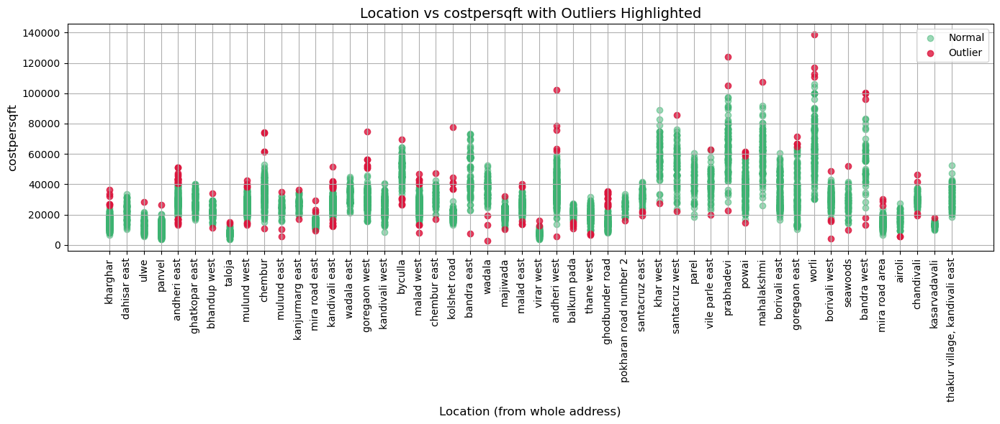

In [24]:
import matplotlib.pyplot as plt
import pandas as pd

# Optional: top N locations by count
top_locations = df['location'].value_counts().index[:] 
filtered_df = df[df['location'].isin(top_locations)]

# Identify outliers per location
def get_outlier_flags(group):
    Q1 = group['costpersqft'].quantile(0.25)
    Q3 = group['costpersqft'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return (group['costpersqft'] < lower) | (group['costpersqft'] > upper)

filtered_df['is_outlier'] = filtered_df.groupby('location', group_keys=False).apply(get_outlier_flags)

# Plot
plt.figure(figsize=(14, 6))
plt.scatter(
    filtered_df[~filtered_df['is_outlier']]['location'],
    filtered_df[~filtered_df['is_outlier']]['costpersqft'],
    alpha=0.5, label='Normal', color='mediumseagreen'
)
plt.scatter(
    filtered_df[filtered_df['is_outlier']]['location'],
    filtered_df[filtered_df['is_outlier']]['costpersqft'],
    alpha=0.8, label='Outlier', color='crimson'
)

plt.xlabel('Location (from whole address)', fontsize=12)
plt.ylabel('costpersqft', fontsize=12)
plt.title('Location vs costpersqft with Outliers Highlighted', fontsize=14)
plt.xticks(rotation=90)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [25]:
# Count of outliers per location
outlier_counts = filtered_df[filtered_df['is_outlier']].groupby('location').size().sort_values(ascending=False)

print(outlier_counts)


location
andheri east              25
kandivali east            20
ghodbunder road           15
malad west                 9
mulund west                8
goregaon west              7
kharghar                   6
andheri west               6
byculla                    6
malad east                 6
kolshet road               6
balkum pada                5
bandra west                5
chembur                    5
powai                      5
mira road east             4
worli                      4
goregaon east              4
chandivali                 4
borivali west              4
thane west                 3
mira road area             3
mulund east                3
wadala                     3
santacruz east             3
prabhadevi                 3
taloja                     2
seawoods                   2
vile parle east            2
santacruz west             2
virar west                 2
airoli                     2
majiwada                   2
kanjurmarg east            2
chemb

In [26]:
total_outlier_counts = filtered_df[filtered_df['is_outlier']].groupby('location').size().sum()
print(total_outlier_counts)

199


`observation`
- Outliers in costpersqft were detected per location using the IQR method (Q1 - 1.5×IQR, Q3 + 1.5×IQR). These extreme values will be removed to enhance data quality.

In [27]:
# Drop outliers from the original DataFrame
outlier_indices = filtered_df[filtered_df['is_outlier']].index
df = df.drop(index=outlier_indices).reset_index(drop=True)

In [28]:
#after observation 
ids_to_update = ['cardid73059851', 'cardid72926775', 'cardid58806131']

df.loc[df['id'].isin(ids_to_update), 'city'] = 'palghar'
df.loc[df['id'].isin(ids_to_update), 'location'] = 'palghar'

In [29]:
#assign 'thane' to the city for all rows where location is 'ulhasnagar'
df.loc[df['location'] == 'ulhasnagar', 'city'] = 'thane'
df.loc[df['location'] == 'agashi', 'city'] = 'palghar'
df.loc[df['location'] == 'bhabola', 'city'] = 'palghar'
df.loc[df['location'] == 'bolinj', 'city'] = 'palghar'
df.loc[df['location'] == 'diwanman', 'city'] = 'palghar'
df.loc[df['location'] == 'dongarpada road', 'city'] = 'palghar'
df.loc[df['location'] == 'evershine city', 'city'] = 'palghar'
df.loc[df['location'] == 'juchandra', 'city'] = 'thane'
df.loc[df['location'] == 'morya nagar', 'city'] = 'palghar'
df.loc[df['location'] == 'oswal nagari', 'city'] = 'thane'
df.loc[df['location'] == 'padmavati nagar bolinj', 'city'] = 'palghar'
df.loc[df['location'] == 'unique garden', 'city'] = 'thane'
df.loc[df['location'] == 'rustomjee global city', 'city'] = 'palghar'
df.loc[df['location'] == 'wagholi', 'city'] = 'thane'
df.loc[df['location'] == 'vinay nagar', 'city'] = 'thane'
df.loc[df['location'] == 'yashwanth nagar', 'city'] = 'palghar'
df.loc[df['location'] == 'dongarpada', 'city'] = 'palghar'
df.loc[df['location'] == 'beverly park', 'city'] = 'thane'
df.loc[df['location'] == 'padrikhan wadi', 'city'] = 'palghar'
df.loc[df['location'] == 'medetiya nagar', 'city'] = 'thane'
df.loc[df['location'] == 'hatkesh udhog nagar', 'city'] = 'thane'
df.loc[df['location'] == 'kashigaon', 'city'] = 'thane'
df.loc[df['location'] == 'kashimira', 'city'] = 'thane'
df.loc[df['location'] == 'sector 8 shanti nagar', 'city'] = 'thane'
df.loc[df['location'] == 'shanti vihar', 'city'] = 'thane'
df.loc[df['location'] == 'chulne', 'city'] = 'palghar'
df.loc[df['location'] == 'mahajan wadi', 'city'] = 'thane'
df.loc[df['location'] == 'sector 9 shanti nagar', 'city'] = 'thane'
df.loc[df['location'] == 'chandan shanti', 'city'] = 'thane'
df.loc[df['location'] == 'pleasant park', 'city'] = 'thane'
df.loc[df['location'] == 'sector 3 shanti nagar', 'city'] = 'thane'
df.loc[df['location'] == 'poonam sagar complex', 'city'] = 'thane'
df.loc[df['location'] == 'stella', 'city'] = 'palghar'
df.loc[df['location'] == 'ramdev park', 'city'] = 'thane'
df.loc[df['location'] == 'golden nest phase 1', 'city'] = 'thane'
df.loc[df['location'] == 'madhuban township', 'city'] = 'palghar'

In [30]:
#nalasopara, virar, vasai, naigaon - palghar
#mira road - thane
#kharghar - navi mumbai

In [31]:
# Update city to 'thane' where address starts with 'mira' (case insensitive)
df.loc[df['address'].str.lower().str.startswith('mira', na=False), 'city'] = 'thane'

In [32]:
#make thane in city for all this ids
ids_to_update = [
    "cardid72703033",
    "cardid69846363",
    "cardid73257889",
    "cardid56191653",
    "cardid72796607",
    "cardid73026297",
    "cardid72794677",
    "cardid66964031",
    "cardid58541153",
    "cardid73076791",
    "cardid72794677",
    "cardid53323155",
    "cardid69812109",
    "cardid69665873",
    "cardid70673145",
    "cardid70120173",
    "cardid60101171",
    "cardid73012265",
    "cardid73028981",
    "cardid71481487",
    "cardid67617413",
    "cardid53977959"
    
]

df.loc[df['id'].isin(ids_to_update), 'city'] = 'thane'

In [33]:
#make palghar in city for all this ids
ids_to_update = [
    "cardid72923721",
    "cardid61647785",
    "cardid70476757",
    "cardid72179863",
    "cardid72846389",
    "cardid73127129",
    "cardid61883771",
    "cardid72998493",
    "cardid73114181",
    "cardid71923233",
    "cardid63887703",
    "cardid72831163"
]

df.loc[df['id'].isin(ids_to_update), 'city'] = 'palghar'

In [34]:
#make navi mumbai in city for all this ids
ids_to_update = [
    "cardid62724753"
]

df.loc[df['id'].isin(ids_to_update), 'city'] = 'navi mumbai'

In [35]:
#this below code is just to identify which id have different location and after that i correct it in above codes
# def get_region(address):
#     address = address.lower()
#     if 'mira road and beyond' in address:
#         return 'thane'
#     elif 'karjat' in address: #cardid33966233
#         return 'new_karjat'
#     elif "mankhurd" in address:  #cardid53977959 
#         return 'new_thane'
#     elif "naigaon" in address:  #cardid72831163 
#         return 'new_palghar'
#     elif "antarli" in address:  #cardid67617413 
#         return 'new_thane'
#     elif "digha" in address or "airoli" in address or "dighe" in address or "kharghar" in address or "taloja" in address or "ghansoli" in address:  
#         return 'new_navi mumbai'    
#     elif 'worli' in address or 'kanjurmarg' in address or 'kandivli' in address or 'dahisar' in address:
#         return 'mumbai'
#     elif 'mira road' in address or 'bhayandar' in address or 'kashimira' in address:
#         return 'thane'
#     elif 'virar' in address or 'vasai' in address:
#         return 'palghar'
#     elif 'dombivli' in address:
#         return 'mumbai metro'
#     elif 'mankivali' in address: #cardid69665873,cardid70673145
#         return 'mankivali_thane'
#     elif 'thane' in address: 
#         return 'thane_thane'
#     elif 'nallasopara' in address or 'nalasopara' in address: 
#         return 'nala_palghar'    
#     else:
#         return 'unknown'

# Apply function to create 'inspect_add' column
# df['inspect_add'] = df['address'].apply(get_region)

In [36]:
df.to_excel('after_drop.xlsx')

In [37]:
# Step 1: Filter columns that start with 'am_'
am_cols = [col for col in df.columns if col.startswith('am_')]

# Step 2: Combine values row-wise into a list
df['amenities'] = df[am_cols].values.tolist()

In [51]:
# import pandas as pd

# # Rearrange columns
# df = df[['id', 'url', 'image', 'image_urls','name',
#          'builder', 'project_name', 'project_in_acres',
#          'wholeaddress', 'address', 'location', 'city',
#          'lattitude', 'longitude', 'locality_rank', 'locality_rating',
#          'property_type', 'property_status', 'property_age', 'ownership', 'furnish', 'flooring',
#          'flat_on_floor', 'total_floor', 'lift', 'overlooking', 'extra_rooms',
#          'bed', 'bath', 'balcony', 'facing', 'area', 'areavsbed',
#          'parking', 'available_units', 'towers', 'costpersqft', 'price_category', 'emi',
#          'education', 'transport', 'shopping_centre', 'commercial_hub', 'hospital', 'tourist',
#          'seller', 'amenities','price']]

# # Save to new CSV
# df.to_csv("reordered_file.csv", index=False)


In [39]:
len(df.columns)

181

In [40]:
df.to_excel('reordered_excelfile.xlsx')

In [41]:
#drop columns 
df = df.drop(columns=['url','image','image_urls','name','wholeaddress','address','locality_rank', 'locality_rating','areavsbed','available_units','towers','price_category'])

In [42]:
df.columns

Index(['id', 'flooring', 'am_12204', 'am_12226', 'am_12225', 'am_12229',
       'am_12230', 'am_1404107', 'am_12201', 'am_12205',
       ...
       'seller', 'education', 'transport', 'shopping_centre', 'commercial_hub',
       'hospital', 'tourist', 'emi', 'project_in_acres', 'amenities'],
      dtype='object', length=169)

# train_test split 

In [43]:
X = df.drop(columns=['price'])
y = df['price']

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

`High level analysis of outliers using - Isolation Forest`

so from excel we can go through each column to check outliers

In [45]:
# Step 1: Select numeric columns and drop rows with NaNs
X_num = X_train.select_dtypes(include="number")
X_train_numeric_clean = X_train.loc[X_num.dropna().index]

# Step 2: Fit IsolationForest
forest = IsolationForest(random_state=42)
X_train_numeric_clean = X_train_numeric_clean.assign(
    outlier=forest.fit_predict(X_train_numeric_clean.select_dtypes(include="number"))
)

# Step 3: Filter detected outliers
outliers_df = X_train_numeric_clean.query("outlier == -1")

# Step 4: Save to Excel
outliers_df.to_excel("outliers_output.xlsx", index=False)

`To identify which column(s) might be responsible for a row being flagged as an outlier by IsolationForest, we can follow this structured approach:`

In [46]:
from scipy.stats import zscore

# Compute Z-scores for numeric columns
z_scores = X_train_numeric_clean.select_dtypes(include="number").apply(zscore)

# Add outlier column
z_scores['outlier'] = X_train_numeric_clean['outlier']

# Filter only outliers
outlier_zscores = z_scores.query("outlier == -1").drop(columns='outlier')

# Get average absolute deviation per feature
deviation_summary = outlier_zscores.abs().mean().sort_values(ascending=False)
print(deviation_summary)


emi                 1.840664
area                1.786132
costpersqft         1.783255
bath                1.707940
parking             1.627519
bed                 1.509124
flat_on_floor       1.455088
total_floor         1.362212
lift                1.255334
balcony             1.232767
longitude           1.226753
project_in_acres    0.518912
lattitude           0.362408
dtype: float64


`Observation`
- Removed NaN values and applied Isolation Forest to check for major outliers.
- The above-listed columns have a high possibility of containing outliers.
- Checked the outlier rows from the Excel sheet and didn’t find any major issues, so continued with missing value imputation.

In [47]:
X_train.isna().sum().sum()

1202554

In [48]:
X_test.isna().sum().sum()

301004

In [50]:
#null_features(X_train)

`observation`
- 11 columns have more than 40% missing values
- parking ,balcony and lift are imp columns and have more than 40% misisng values
- columns such as tourist,hospital,transport,commercial_hub, education ,shopping_centre from alll this column I make new features in feature engineering 

In [52]:
#null_features(X_test)

`observation`
- after train test split in both data X_train and X_test have almost equal percentage of missing values hence we can proceed with this split
- 11 columns have more than 40% missing values 

In [53]:
#First we create a list of missing values by each feature
temp = list(X_train.isna().sum())

#then we create a list of columns and their missing values as inner list to a separate list
lst= []
i=0
for col in X_train.columns:
    insert_lst = [col,temp[i]]
    lst.append(insert_lst)
    i+=1

#finally create a dataframe
temp_X_train = pd.DataFrame(data=lst,columns=['Column_Name','Missing_Values'])

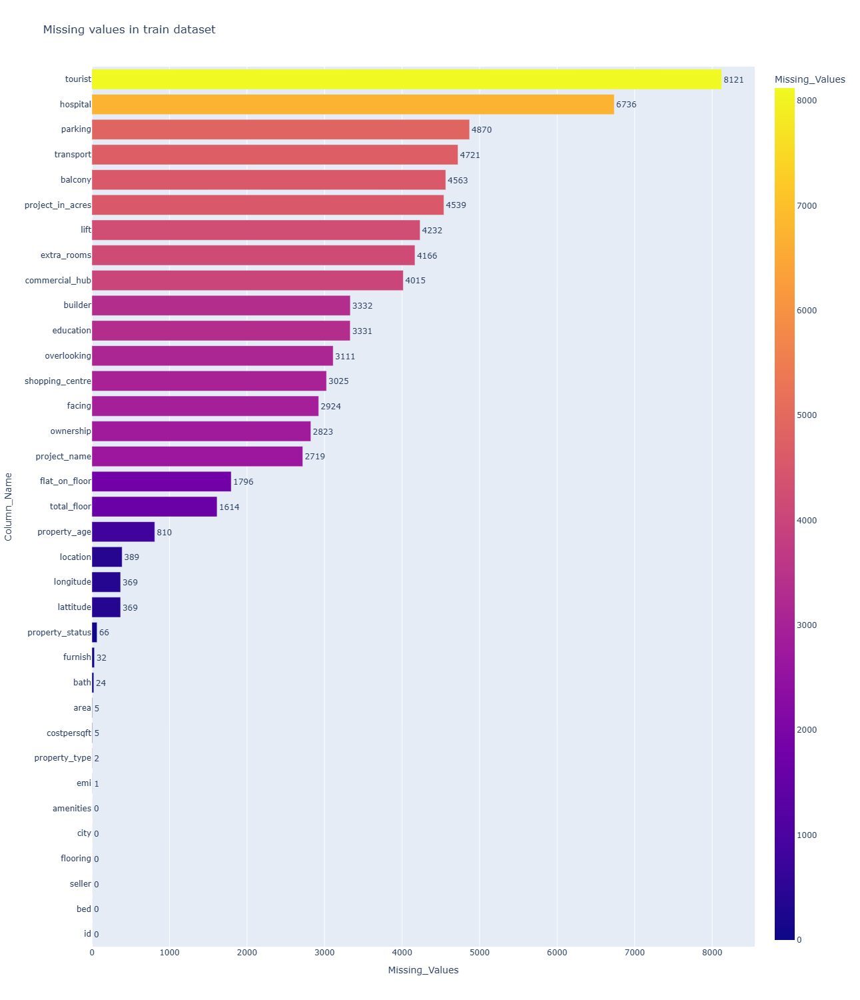

In [54]:
fig = px.bar(temp_X_train.sort_values(by='Missing_Values'),x='Missing_Values',y='Column_Name',
             orientation='h',height=1500,width=1100,color='Missing_Values',text='Missing_Values',title='Missing values in train dataset')
fig.update_traces(textposition='outside')
fig.show()

In [55]:
#First we create a list of missing values by each feature
temp = list(X_test.isna().sum())

#then we create a list of columns and their missing values as inner list to a separate list
lst= []
i=0
for col in X_test.columns:
    insert_lst = [col,temp[i]]
    lst.append(insert_lst)
    i+=1

#finally create a dataframe
temp_X_test = pd.DataFrame(data=lst,columns=['Column_Name','Missing_Values'])

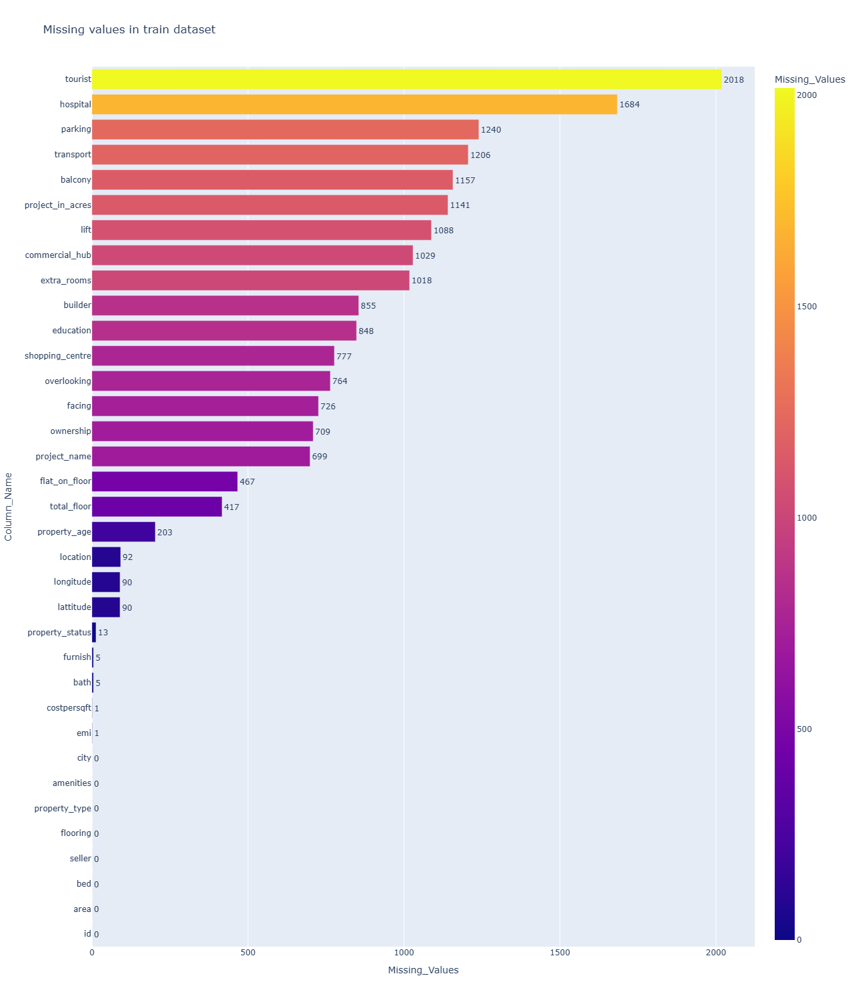

In [56]:
fig = px.bar(temp_X_test.sort_values(by='Missing_Values'),x='Missing_Values',y='Column_Name',
             orientation='h',height=1500,width=1100,color='Missing_Values',text='Missing_Values',title='Missing values in train dataset')
fig.update_traces(textposition='outside')
fig.show()

`observation`
- from X_train data total 36 columns have missing values
- from X_test total 33 columns have missing values 

# Missingo for Missing Values

In [57]:
X_train.shape

(9328, 35)

<Axes: >

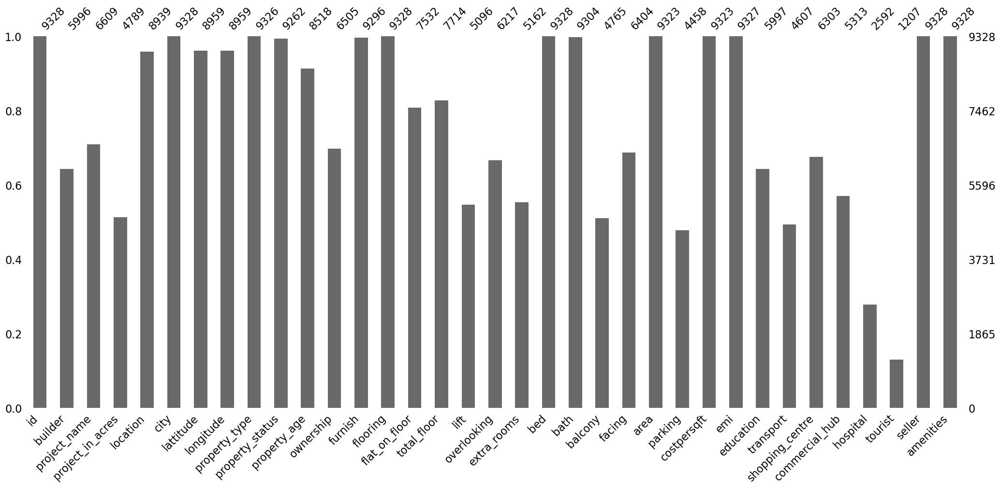

In [58]:
# Bar plot to visualize missing values
msno.bar(X_train)

<Axes: >

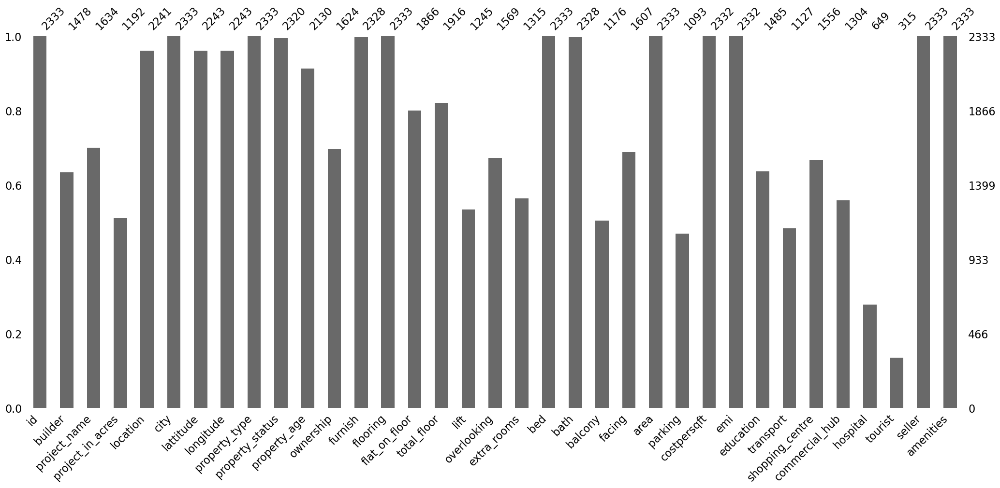

In [59]:
# Bar plot to visualize missing values
msno.bar(X_test)

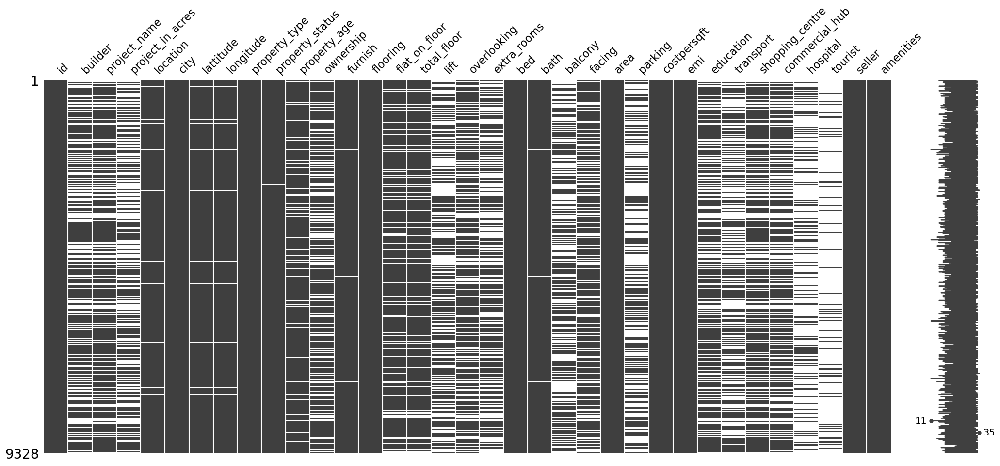

In [60]:
# Matrix chart to visualize missing values
msno.matrix(X_train)
plt.show()

`observation`
- The numbers 44 and 14 show that those rows contain 44 and 14 non-missing values, respectively.
- The white spaces indicate missing values.The black spaces represent present (non-missing) values.
- out of 45 columns 22 columns have major mising values 

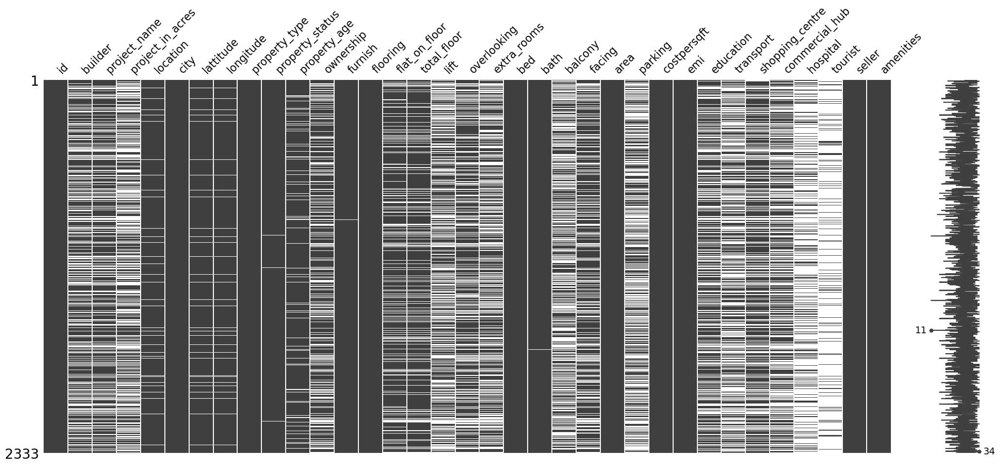

In [61]:
# Matrix chart to visualize missing values
msno.matrix(X_test)
plt.show()

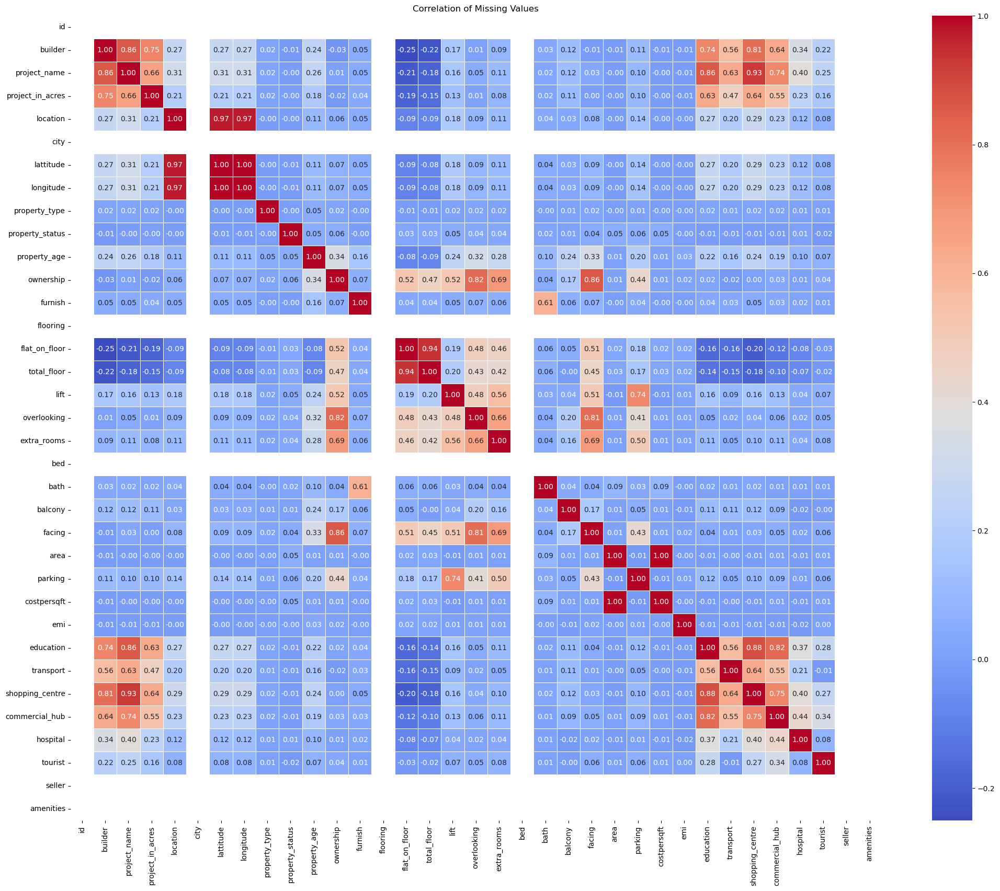

In [62]:
# Compute the missingness correlation
X_train_missing_corr_matrix = X_train.isnull().corr()

plt.figure(figsize=(25,20))
sns.heatmap(X_train_missing_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation of Missing Values")
plt.show()

In [63]:
# Get categorized missing value relationships for X_train data 
missingness_categories = categorize_missingness(X_train_missing_corr_matrix)

# Print results
for category, related_columns in missingness_categories.items():
    print(f"\n{category}:")
    for col, related in related_columns.items():
        print(f"{col}: {', '.join(related)}")


exact 1.00 means always Missing Together:
lattitude: longitude
area: costpersqft

less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together:
builder: project_name, project_in_acres, education, shopping_centre
project_name: education, shopping_centre, commercial_hub
location: lattitude, longitude
ownership: overlooking, facing
flat_on_floor: total_floor
lift: parking
overlooking: facing
education: shopping_centre, commercial_hub
shopping_centre: commercial_hub

less than 0.7 but greater than equal to 0.4 means moderately Related Missingness:
builder: transport, commercial_hub
project_name: project_in_acres, transport
project_in_acres: education, transport, shopping_centre, commercial_hub
ownership: flat_on_floor, total_floor, lift, extra_rooms, parking
furnish: bath
flat_on_floor: overlooking, extra_rooms, facing
total_floor: overlooking, extra_rooms, facing
lift: overlooking, extra_rooms, facing
overlooking: extra_rooms, parking
extra_rooms: facing, parki

`observation`
- "Unrelated Missingness" means that the missing values in two columns have no meaningful relationship.

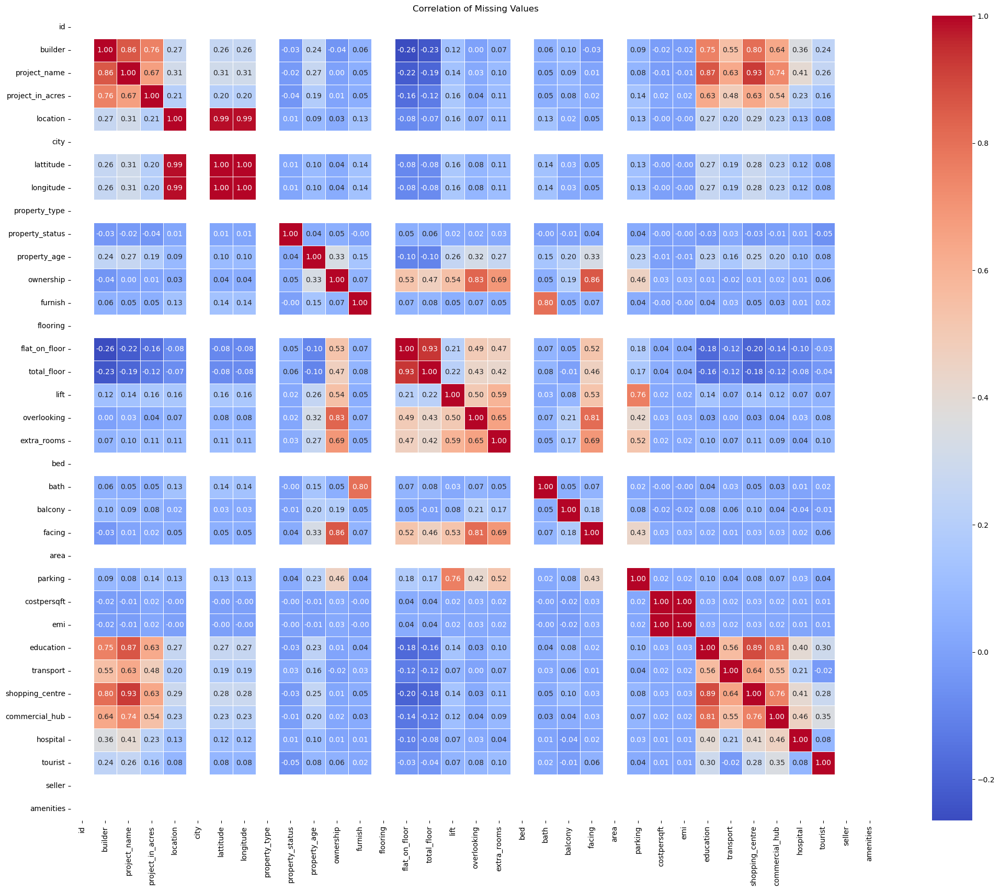

In [64]:
# Compute the missingness correlation
X_test_missing_corr_matrix = X_test.isnull().corr()

plt.figure(figsize=(25,20))
sns.heatmap(X_test_missing_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation of Missing Values")
plt.show()

In [65]:
# Get categorized missing value relationships for X_test data 
missingness_categories = categorize_missingness(X_test_missing_corr_matrix)

# Print results
for category, related_columns in missingness_categories.items():
    print(f"\n{category}:")
    for col, related in related_columns.items():
        print(f"{col}: {', '.join(related)}")


exact 1.00 means always Missing Together:
lattitude: longitude
costpersqft: emi

less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together:
builder: project_name, project_in_acres, education, shopping_centre
project_name: education, shopping_centre, commercial_hub
location: lattitude, longitude
ownership: overlooking, facing
furnish: bath
flat_on_floor: total_floor
lift: parking
overlooking: facing
education: shopping_centre, commercial_hub
shopping_centre: commercial_hub

less than 0.7 but greater than equal to 0.4 means moderately Related Missingness:
builder: transport, commercial_hub
project_name: project_in_acres, transport, hospital
project_in_acres: education, transport, shopping_centre, commercial_hub
ownership: flat_on_floor, total_floor, lift, extra_rooms, parking
flat_on_floor: overlooking, extra_rooms, facing
total_floor: overlooking, extra_rooms, facing
lift: overlooking, extra_rooms, facing
overlooking: extra_rooms, parking
extra_rooms: faci

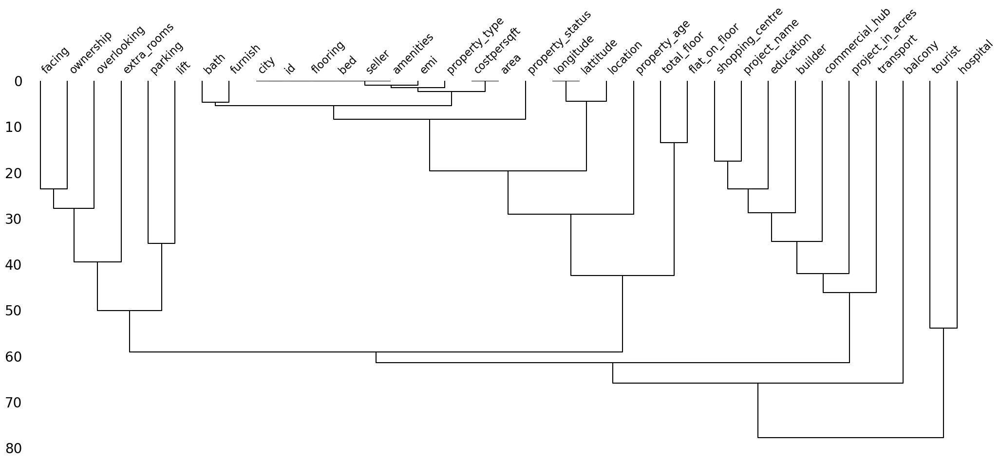

In [66]:
# Dendrogram to visualize the hierarchical clustering of missing values
msno.dendrogram(X_train)
plt.show()

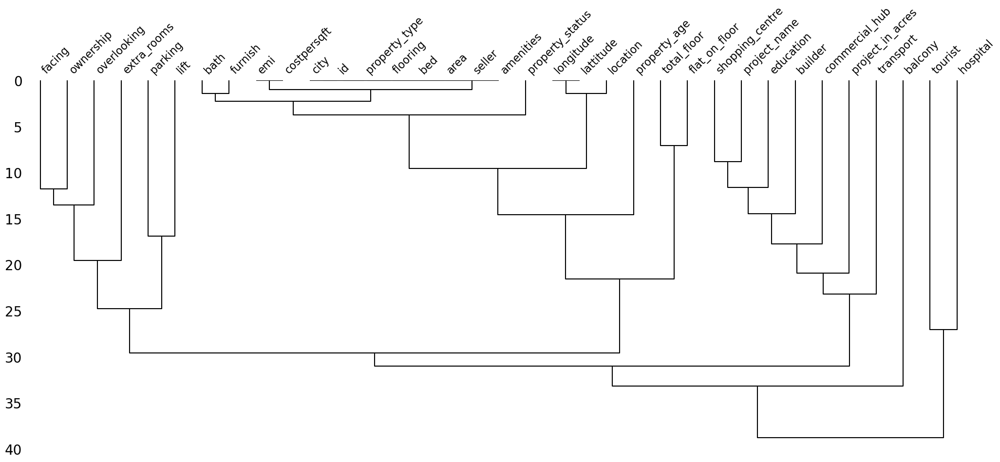

In [67]:
# Dendrogram to visualize the hierarchical clustering of missing values
msno.dendrogram(X_test)
plt.show()

`observation`
- from dendograms we can say that this categorize_missingness function works well 

`notes`  
- **MCAR (Missing Completely at Random):**  
  - Probability of missing data does not depend on observed or unobserved data.  
  - Outcome: If we remove missing values from an MCAR column, the distribution before and after removal remains the same, meaning their absence doesn’t bias the data.  
  - Handling: We can use removal, imputation, or algorithms that handle missing data.
  - Use Little’s MCAR test to statistically verify if data is MCAR.  
- **MAR (Missing at Random):**  
  - Probability of missing data depends on observed data but not on unobserved data.  
  - Handling: Use imputation or algorithms that handle missing values.
  - use KDE plot to detect MAR
- **MNAR (Missing Not at Random):**  
  - Probability of missing data depends on unobserved data, meaning the missingness is related to the actual missing values.  
  - Handling: If we cannot confirm whether data is MCAR or MAR, we assume it could be MNAR.
- **Techniques to Handle Missing Values:**  
  1. Removing: Drop missing values (use only if missingness is small & MCAR).  
  2. Imputation: Fill missing values (various techniques exist).  
  3. Using algorithms that handle missing values natively: E.g., XGBoost, LightGBM.  
  4. Choosing appropriate imputation methods:  
     - Continuous data: Mean, median, regression-based imputation.  
     - Categorical data: Mode, predictive modeling, category-specific imputation.    
- **Key Point:**  
  - Preserve the data distribution before and after handling missing values to avoid bias.
  - If we drop the missing value rows of any column then to check for categorical data we use PMF method 

`observation`
- Drop columns with too many missing values (e.g., >40-50%).
- Since columns are MCAR with <5% missing data, removing rows won’t bias the distribution, making it an acceptable choice over imputation.
- so in X_train data 11 columns have more than 40% missing values 
- so I wont drop them yet as I plan to create a new features from them

`observation`  
Missing Value Analysis

- use Little’s MCAR test to distinguish between MAR, MCAR, and MNAR.
- Use correlation analysis to check if missing values are dependent on other features (MAR).
- For MNAR, check if missingness correlates with the target variable.

In [68]:
df.columns

Index(['id', 'builder', 'project_name', 'project_in_acres', 'location', 'city',
       'lattitude', 'longitude', 'property_type', 'property_status',
       'property_age', 'ownership', 'furnish', 'flooring', 'flat_on_floor',
       'total_floor', 'lift', 'overlooking', 'extra_rooms', 'bed', 'bath',
       'balcony', 'facing', 'area', 'parking', 'costpersqft', 'emi',
       'education', 'transport', 'shopping_centre', 'commercial_hub',
       'hospital', 'tourist', 'seller', 'amenities', 'price'],
      dtype='object')

`observation`
- work on the above numerical features 1st 

In [69]:
#find the numerical columns
numerical_columns = X_train.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['project_in_acres', 'lattitude', 'longitude', 'flat_on_floor',
       'total_floor', 'lift', 'bed', 'bath', 'balcony', 'area', 'parking',
       'costpersqft', 'emi'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 13


`t-tests on specific variables test`  
only did here for numerical columns 

In [70]:
# Analyze column
analyze_missing_column(X_train, 'balcony')

Means with 'balcony' missing:
 project_in_acres       13.121589
lattitude              19.141292
longitude              72.896637
flat_on_floor           9.859766
total_floor            20.357521
lift                    2.985392
bed                     1.992330
bath                    2.148173
balcony                      NaN
area                  766.366228
parking                 1.262774
costpersqft         27764.476101
emi                     1.108350
dtype: float64

Means without 'balcony' missing:
 project_in_acres       19.209246
lattitude              19.147234
longitude              72.914717
flat_on_floor          11.896394
total_floor            24.048756
lift                    3.208148
bed                     2.315425
bath                    2.471861
balcony                 1.856873
area                  970.456645
parking                 1.494798
costpersqft         27352.119763
emi                     1.466746
dtype: float64

Absolute Differences (Sorted):
 costpersqft  

In [71]:
# Analyze parking column with 4 predictor variables
analyze_missing_column_with_predictors(X_train, 'flat_on_floor', ['project_in_acres', 'area', 'bath', 'parking'])



T-test for project_in_acres:
T-statistic: 0.05099874739030457, P-value: 0.959328646934595
project_in_acres is NOT significantly different, so 'flat_on_floor' is likely MCAR.

T-test for area:
T-statistic: -5.168385806366703, P-value: 2.4980312395983135e-07
area is significantly different between missing and non-missing groups of 'flat_on_floor', so 'flat_on_floor' is likely MAR.

T-test for bath:
T-statistic: -2.8257908075558436, P-value: 0.0047445503088117515
bath is significantly different between missing and non-missing groups of 'flat_on_floor', so 'flat_on_floor' is likely MAR.

T-test for parking:
T-statistic: -8.364348121318322, P-value: 2.451307260833641e-16
parking is significantly different between missing and non-missing groups of 'flat_on_floor', so 'flat_on_floor' is likely MAR.


`observation`
- If a column is MCAR, removing rows with NaNs does not affect other columns’ distributions. But if the column is MAR, removing rows with NaNs does affect other columns’ distributions.
- Little’s MCAR test provides a global assessment of missingness across all numerical features, whereas t-tests only compare specific variables, making Little’s test more comprehensive. hence further go with only Little MCAR test
- have only done it on numerical columns; for categorical columns, still need to work.

`Little’s MCAR Test`  
only did here for numerical columns 

In [72]:
# Run Little’s MCAR test only on numerical features
chi_square, p_value = littles_mcar_test(X_train)
print(f"Chi-Square: {chi_square}, p-value: {p_value}")

if p_value > 0.05:
    print("Fail to reject MCAR hypothesis → Data is MCAR.")
else:
    print("Reject MCAR hypothesis → Data is not MCAR, so it can be MAR or MNAR.")

Chi-Square: 28990.540429758024, p-value: 0.0
Reject MCAR hypothesis → Data is not MCAR, so it can be MAR or MNAR.


`observation`
- A rejection of the MCAR hypothesis means that at least one or more numerical columns have missing values that are not missing completely at random—but this does not necessarily mean all columns are MAR or MNAR.
- have only done it on numerical columns; for categorical columns, still need to work.

`Predictive Modeling for Missingness`

In [73]:
# Create missing indicator for 'area'
df['area_missing'] = df['area'].isnull().astype(int)

# Select only numerical columns
num_features = df.select_dtypes(include=['number']).columns.tolist()

# Drop 'area', 'price', and 'area_missing' from features
drop_cols = ['area', 'price', 'area_missing']
X_new = df[num_features].drop(columns=drop_cols)
y_new = df['area_missing']

# Split the data
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.3, random_state=42)

# Impute missing values
imputer = SimpleImputer(strategy='median')
X_train_new = imputer.fit_transform(X_train_new)
X_test_new = imputer.transform(X_test_new)

# Fit the logistic regression model
model = LogisticRegression()
model.fit(X_train_new, y_train_new)

# Evaluate the model
predictions = model.predict(X_test_new)
print(classification_report(y_test_new, predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3499

    accuracy                           1.00      3499
   macro avg       1.00      1.00      1.00      3499
weighted avg       1.00      1.00      1.00      3499



In [74]:
model.coef_

array([[-1.10641904e-01, -2.87914500e-02, -7.79540877e-02,
        -7.95443548e-02, -8.49476509e-03, -1.15664962e-02,
         6.89403738e-02,  1.67020580e-01, -8.86567540e-02,
         1.05288773e-01, -2.64874562e-05,  1.63045161e-01]])

`observation`
- Accuracy: 65% → Model is moderately good at predicting missing parking.
- Recall for 1 (missing) is 0.81 → Better at detecting missing values.
- Recall for 0 (not missing) is 0.47 → Struggles to detect non-missing values.
- Since accuracy is not perfect,X_new only partially explains missingness → Parking is partially MAR.
- Low accuracy suggests some missingness might be MNAR.
- If any feature had a large positive or negative coefficient, it would mean parking missingness strongly depends on that feature. but as Small coefficients (-0.02 to 0.01) → No strong influence from features.
- Weak relationship between parking missingness and X_new.
- unclear whether the missingness MAR or MNAR.

`conclusion`
- all numerical column checked and for all numerical columns unclear whether the missingness MAR or MNAR.
- both test `t-tests on specific variables test` and `Little’s MCAR Test` fail to detect the MAR,MCAR and MNAR columns
- and we have work only on numerical columns till now using both this test , categorical columns are still pending

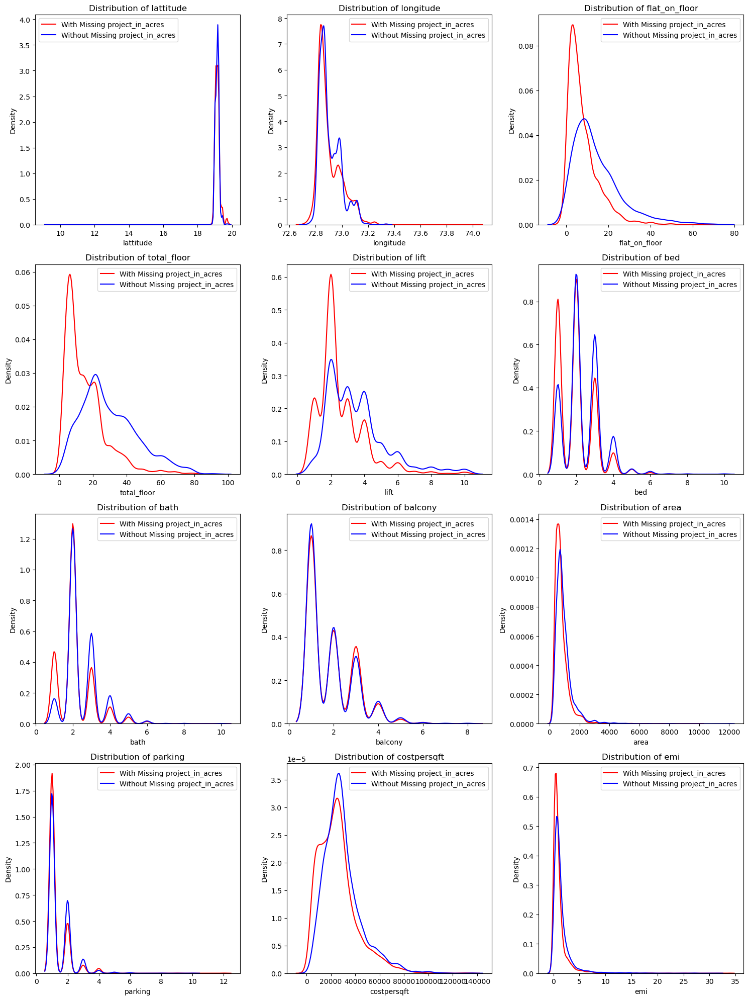

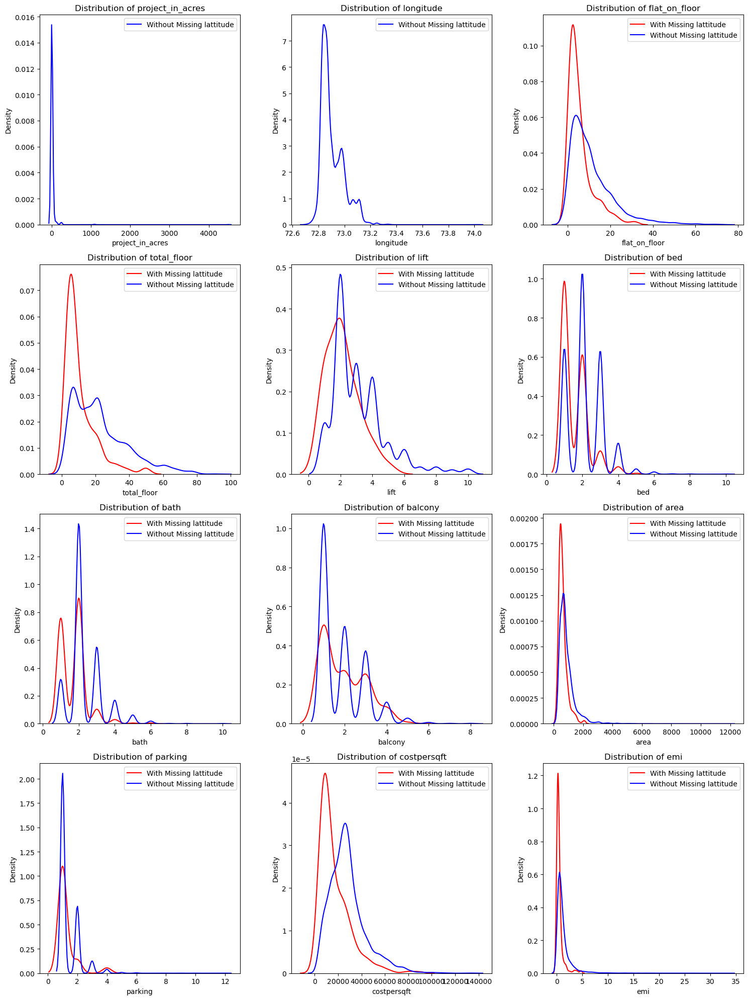

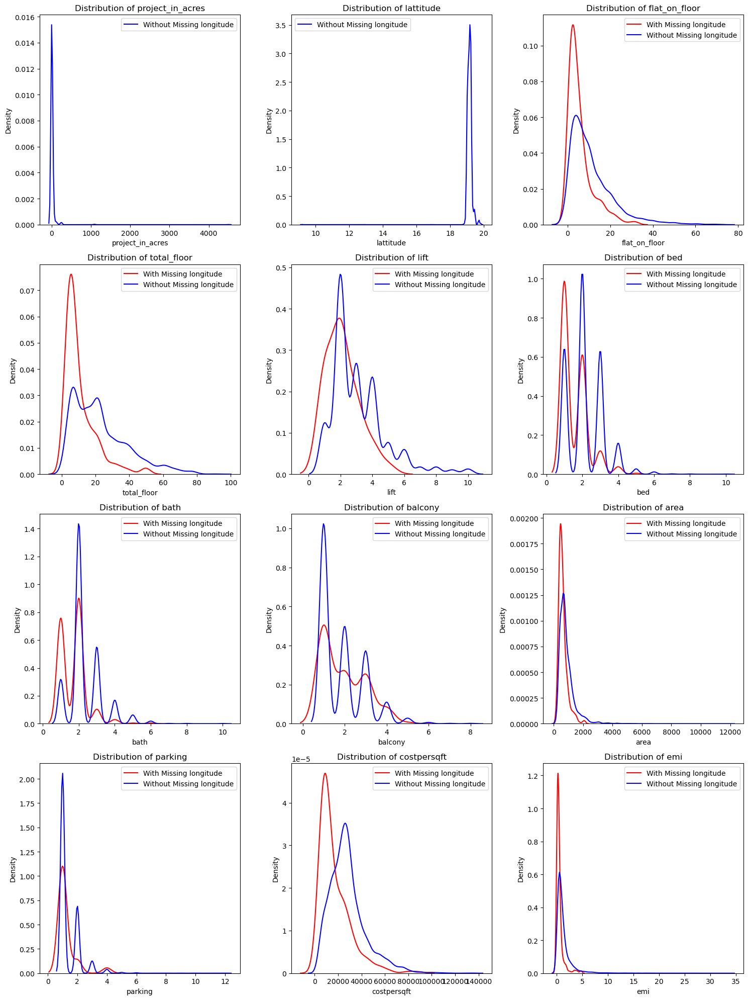

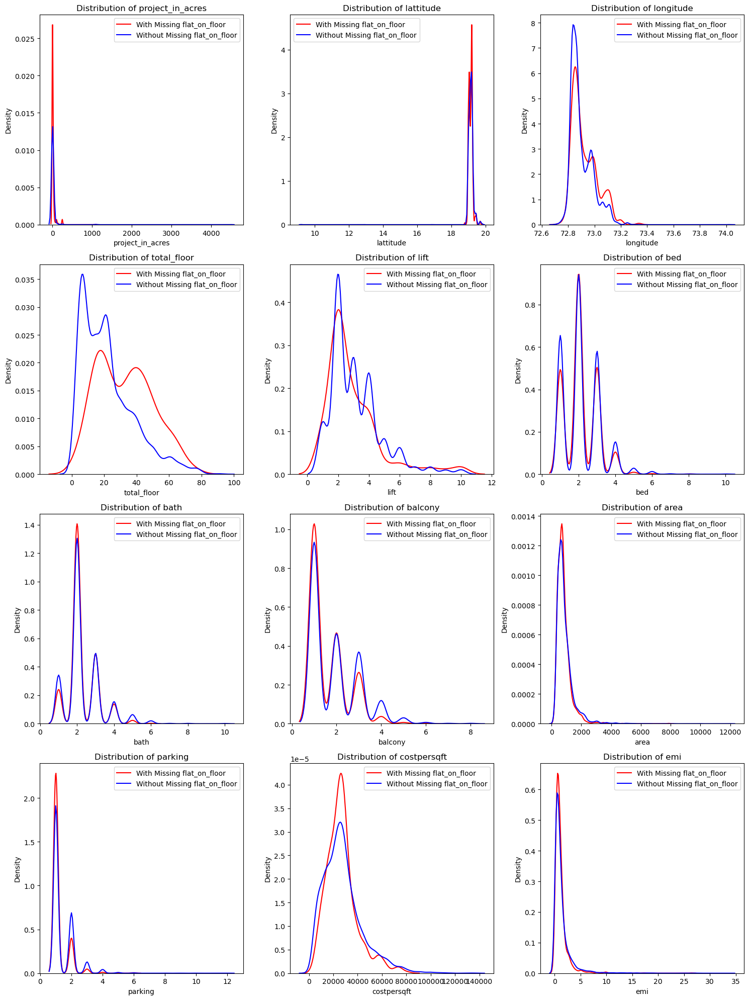

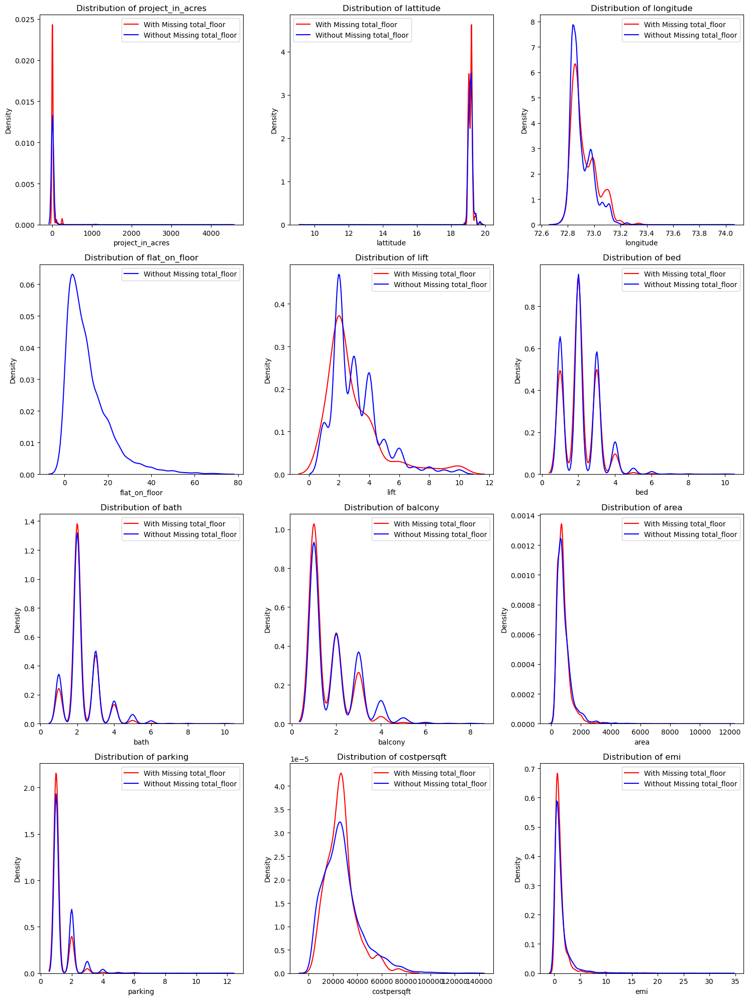

...

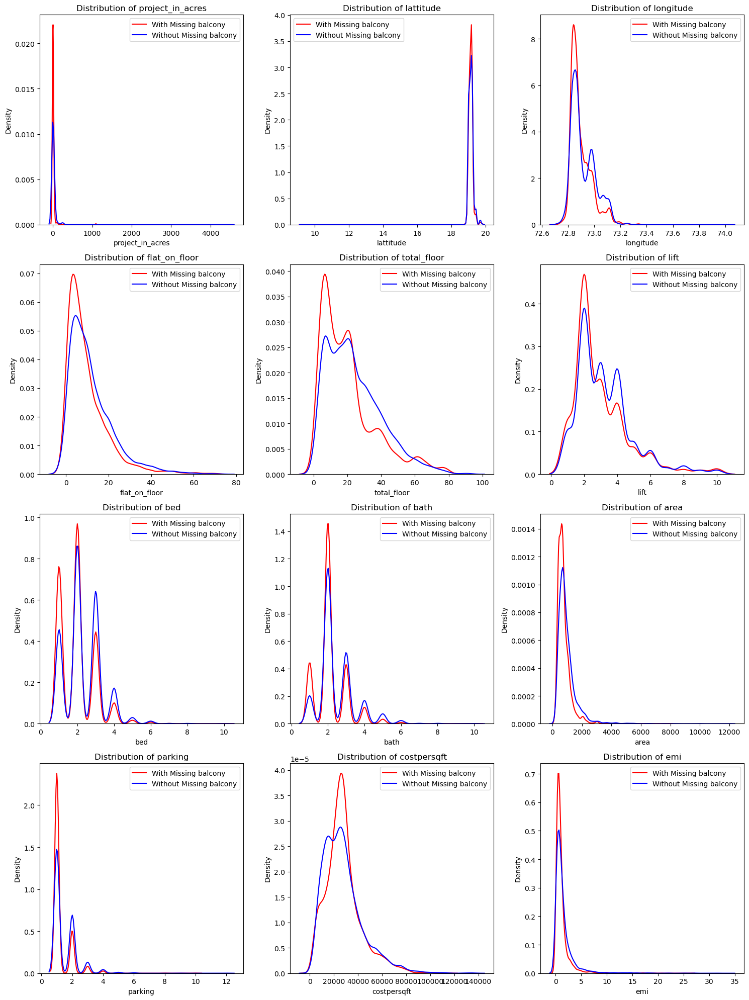

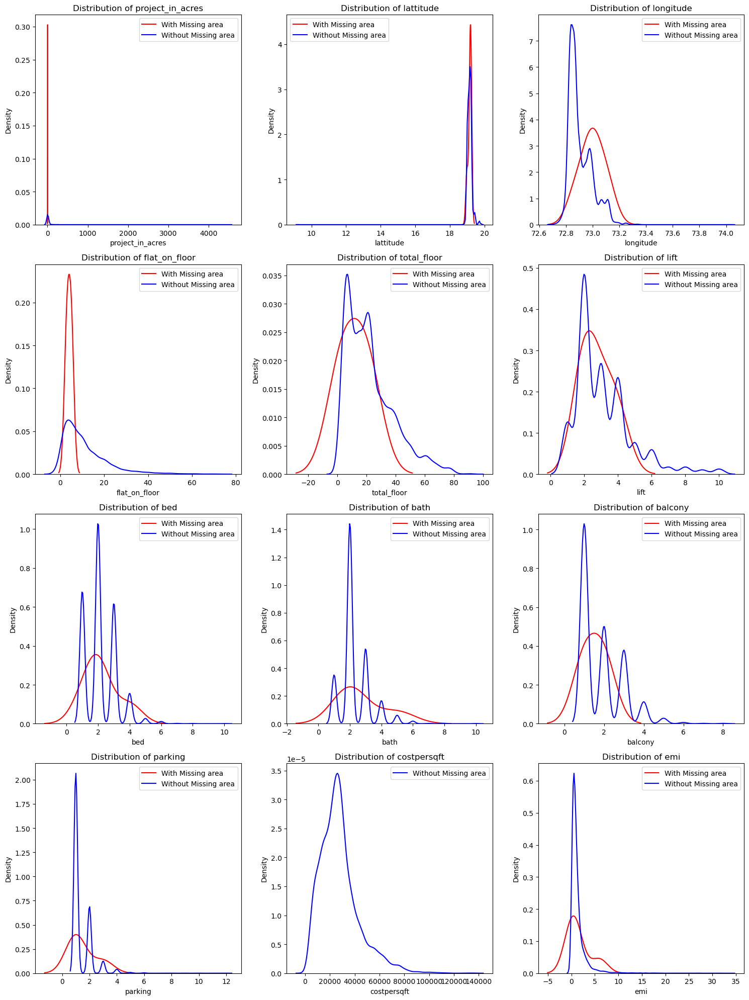

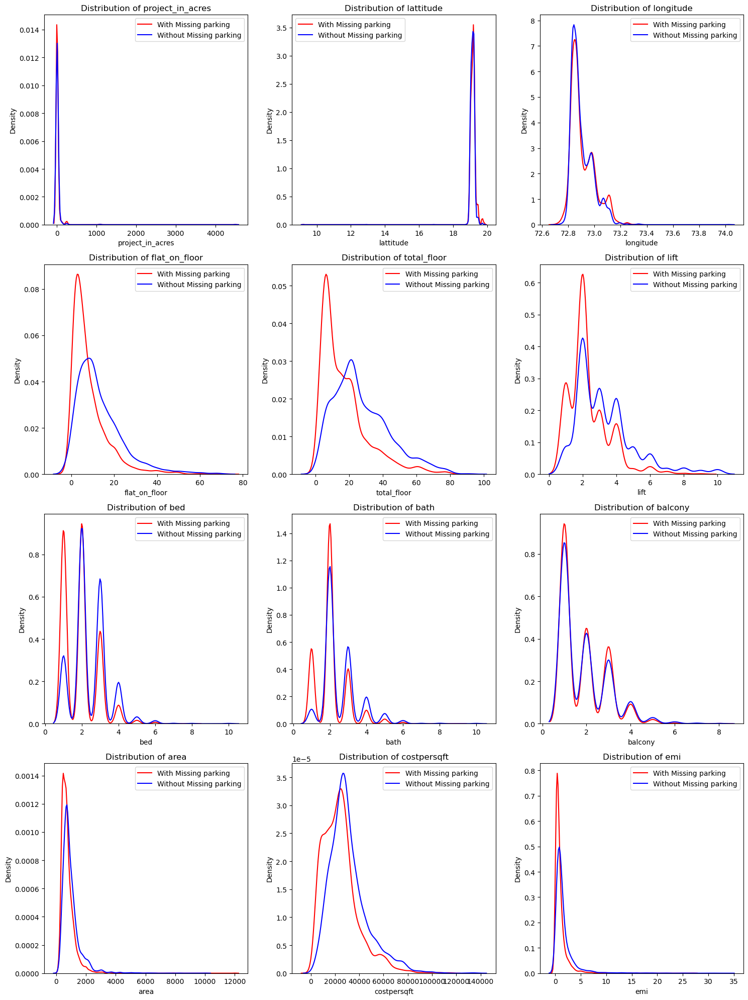

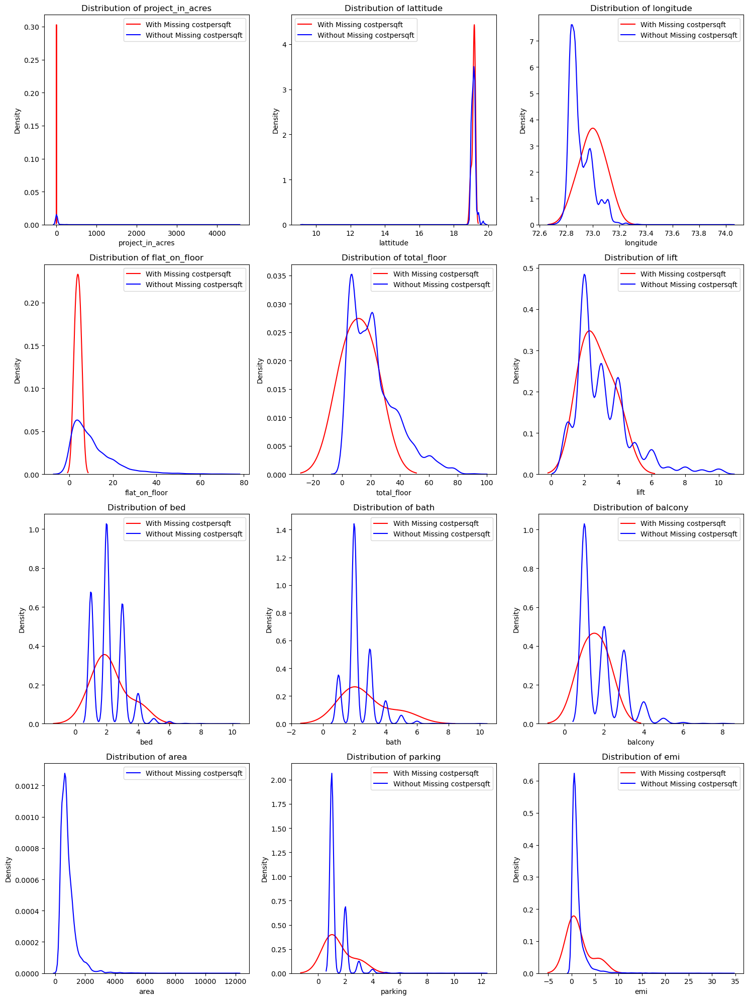

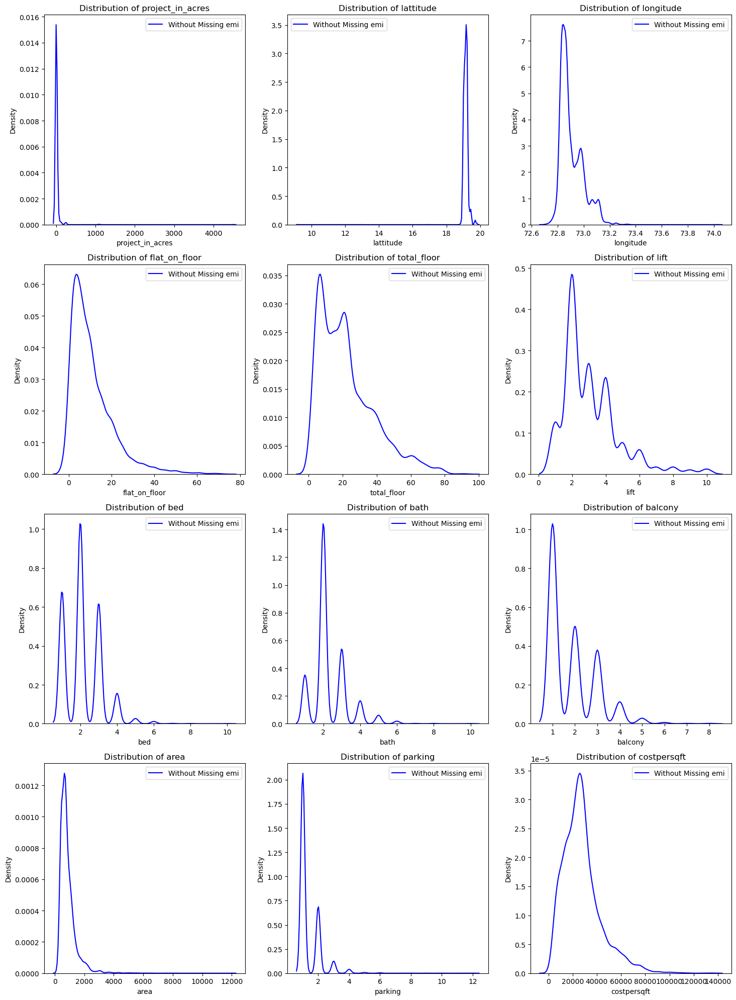

In [75]:
# Select only numeric columns
numeric_features = X_train.select_dtypes(include=['number']).columns

# Iterate over each numeric column as Feature1 (the column with missing values)
for feature1 in numeric_features:
    if X_train[feature1].isnull().sum() > 0:  # Process only if feature1 has missing values
        group_with_missing = X_train[X_train[feature1].isnull()]
        group_without_missing = X_train[~X_train[feature1].isnull()]

        # Get the numeric features excluding feature1
        other_features = [feature for feature in numeric_features if feature != feature1]
        
        # Define grid size
        num_features = len(other_features)
        num_cols = 3  # Number of columns in the grid
        num_rows = int(np.ceil(num_features / num_cols))  # Calculate required rows

        fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5 * num_rows))
        axes = axes.flatten()  # Flatten to easily iterate

        for i, feature2 in enumerate(other_features):
            sns.kdeplot(group_with_missing[feature2].dropna(), color='red', label=f'With Missing {feature1}', common_norm=False, ax=axes[i])
            sns.kdeplot(group_without_missing[feature2].dropna(), color='blue', label=f'Without Missing {feature1}', common_norm=False, ax=axes[i])
            axes[i].set_title(f'Distribution of {feature2}')
            axes[i].legend()

        # Hide unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()


`observation`
- graphs affected because of removing the outliers and graphs not affected by removing the outliers, both graphs are present for each feature and hence its hard to detect MAR from kde plot also 

Observation  
- Till now, all techniques have failed. Now, let's fill the missing values:  
  - Univariate Imputation: In this technique, we use the same column to fill its missing values.
      - means suppose age has missing vlaues so we take the help of the same age column values only to fill the missing values of age column
      - for univariate use 2 sklearn class
          - 1)sklearn Missing indicator
          - 2)sklearn simple imputer
  - Multivariate Imputation: In this technique, we use other columns to fill the missing values.
      - so suppose we have f1,f2,f3 column then to fill the f2 column missing values we take the help of the f1 and f3 columnm

In [76]:
df.columns

Index(['id', 'builder', 'project_name', 'project_in_acres', 'location', 'city',
       'lattitude', 'longitude', 'property_type', 'property_status',
       'property_age', 'ownership', 'furnish', 'flooring', 'flat_on_floor',
       'total_floor', 'lift', 'overlooking', 'extra_rooms', 'bed', 'bath',
       'balcony', 'facing', 'area', 'parking', 'costpersqft', 'emi',
       'education', 'transport', 'shopping_centre', 'commercial_hub',
       'hospital', 'tourist', 'seller', 'amenities', 'price', 'area_missing'],
      dtype='object')

In [77]:
#find the categorical columns

categorical_columns = X_train.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
print("-" * 100)
print(f'Total categorical columns: {len(categorical_columns)}')

Index(['id', 'builder', 'project_name', 'location', 'city', 'property_type',
       'property_status', 'property_age', 'ownership', 'furnish', 'flooring',
       'overlooking', 'extra_rooms', 'facing', 'education', 'transport',
       'shopping_centre', 'commercial_hub', 'hospital', 'tourist', 'seller',
       'amenities'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Total categorical columns: 22


# Transformation Operations 

# numerical columns 

In [78]:
#find the numerical columns
numerical_columns = X_train.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['project_in_acres', 'lattitude', 'longitude', 'flat_on_floor',
       'total_floor', 'lift', 'bed', 'bath', 'balcony', 'area', 'parking',
       'costpersqft', 'emi'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 13


lets perform all analysis one by one on numerical column 1st

In [79]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np

# Step 1: Select numerical columns only
numerical_cols = X_train.select_dtypes(include=[np.number]).columns

# Step 2: Subset the training data to only numerical columns
X_train_num = X_train[numerical_cols]

# Step 3: Fill missing values (simple zero fill here, or you can use SimpleImputer etc.)
X_train_num_filled = X_train_num.fillna(0)

# Step 4: Train RandomForest and get importances
model = RandomForestRegressor(random_state=42)
model.fit(X_train_num_filled, y_train)

# Step 5: Get feature importances
importances = pd.Series(model.feature_importances_, index=numerical_cols).sort_values(ascending=False)

# Display the feature importances
print("Feature Importances:")
print(importances)

# Add y_train as a temporary column for correlation
temp = X_train.copy()
temp['target'] = y_train

# Step 6: Compute Spearman correlation of all numerical columns with the target
correlations = temp.corr(method='spearman', numeric_only=True)['target'].sort_values(ascending=False)

# Display the Spearman correlation
print("\nSpearman Correlations:")
print(correlations)

# Step 7: Set thresholds for filtering
threshold_corr = 0.1  # Weak correlation threshold
threshold_importance = 0.0001  # Low importance threshold

# Step 8: Filter features that have weak correlation and low importance
features_to_drop = correlations[correlations.abs() < threshold_corr].index.tolist()
features_to_drop += importances[importances < threshold_importance].index.tolist()

# Remove duplicates
features_to_drop = list(set(features_to_drop))

# Optionally, consider borderline features for testing
borderline_features = correlations[correlations.abs() < threshold_corr].index.tolist()
borderline_features = [f for f in borderline_features if f not in features_to_drop]

# Display the features to drop and borderline features
print("\nFeatures to drop based on weak correlation and low importance:")
print(features_to_drop)

print("\nBorderline features (for testing):")
print(borderline_features)


Feature Importances:
emi                 0.995358
area                0.003120
parking             0.000385
bed                 0.000217
lattitude           0.000175
longitude           0.000149
lift                0.000122
bath                0.000105
project_in_acres    0.000104
balcony             0.000097
total_floor         0.000070
flat_on_floor       0.000067
costpersqft         0.000030
dtype: float64

Spearman Correlations:
target              1.000000
emi                 0.999984
costpersqft         0.876804
area                0.809310
bed                 0.802934
bath                0.748231
parking             0.554044
total_floor         0.454108
flat_on_floor       0.391680
lift                0.336538
project_in_acres    0.039056
balcony            -0.066863
longitude          -0.351269
lattitude          -0.366170
Name: target, dtype: float64

Features to drop based on weak correlation and low importance:
['total_floor', 'project_in_acres', 'flat_on_floor', 'costpersqf

`observation`
- 'locality_rank', 'towers', 'costpersqft', 'longitude', 'total_floor', 'flat_on_floor', 'available_units', 'locality_rating', 'project_in_acres', 'balcony' this features are get less importance according to sperarman correlation and random forest so we can drop this column
- but still I plan do all procedure before dropping all above columns
- also in above random forest method fill the missing values using '0', where we can use other imputation techniques also

drop/delete this above observation once we complete whole analysis below , this above just for initial chk

In [80]:
#df.to_csv('finaldata.csv',index=False)

In [101]:
df = pd.read_csv('finaldata.csv')

In [102]:
#df.to_excel('finaldata.xlsx')

from chatgpt i get this below code  
in this below code I apply optuna with all this techniques

Missing Value Imputation  
Outlier Removal  
Feature Transformation  
Feature Encoding  
Feature Extraction  
Feature Selection  
Feature Scaling  
Imbalanced Data Handling  
Model Training



Note: I will follow a two-step strategy for preprocessing optimization

---

Step 1: Per-Column Optimization (`column_objective`)  
- Individually optimize each feature to find the best imputation, transformation, outlier handling, and scaling strategy.  
- Allows targeted experimentation for specific feature improvements.  
  Featureample: Test transformation strategies for features like `hospital`, `school`, etc., either individually or in groups if they share similar behavior.  
- Helps identify low-utility columns early (e.g., all-NaN or constant features).

---

Step 2: Hybrid Pipeline  
- Build a full pipeline using the best preprocessing strategies from Step 1.  
- Evaluate features together to account for interactions between them — something not captured in isolated column-wise studies.  
- Combines local (per-column) optimization with global (pipeline-wide) optimization for better ovemments for your script.ipt as a comment block!

# marked

In [103]:
df=df.drop(columns=['area_missing'])

In [104]:
df.columns

Index(['id', 'builder', 'project_name', 'project_in_acres', 'location', 'city',
       'lattitude', 'longitude', 'property_type', 'property_status',
       'property_age', 'ownership', 'furnish', 'flooring', 'flat_on_floor',
       'total_floor', 'lift', 'overlooking', 'extra_rooms', 'bed', 'bath',
       'balcony', 'facing', 'area', 'parking', 'costpersqft', 'emi',
       'education', 'transport', 'shopping_centre', 'commercial_hub',
       'hospital', 'tourist', 'seller', 'amenities', 'price'],
      dtype='object')

# Missing value Imputation

In [85]:
#find the numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['project_in_acres', 'lattitude', 'longitude', 'flat_on_floor',
       'total_floor', 'lift', 'bed', 'bath', 'balcony', 'area', 'parking',
       'costpersqft', 'emi', 'price'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 14


In [105]:
X = df.drop(columns=['price'])
y = df['price']

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [107]:
missing_info(X_train,dtype='numeric')

,count,percentage
variable,,
parking,4870,52.208405
balcony,4563,48.917238
project_in_acres,4539,48.659949
lift,4232,45.368782
flat_on_floor,1796,19.253859
total_floor,1614,17.302744
lattitude,369,3.955832
longitude,369,3.955832
bath,24,0.257290


In [89]:
X_train['lift'].isna().sum()

4232

in this below only use imputer and one outlier LOF 

In [90]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
import numpy as np

# Custom transformer for LOF
class LOFOutlierDetector(BaseEstimator, TransformerMixin):
    def __init__(self, n_neighbors=20, contamination=0.1):
        self.n_neighbors = n_neighbors
        self.contamination = contamination

    def fit(self, X, y=None):
        self.lof_ = LocalOutlierFactor(n_neighbors=self.n_neighbors,
                                       contamination=self.contamination,
                                       novelty=False)
        self.outlier_labels_ = self.lof_.fit_predict(X)
        return self

    def transform(self, X):
        # Add outlier label as an additional feature
        return np.hstack([X, self.outlier_labels_.reshape(-1, 1)])

# Define pipeline
flat_on_floor_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),
    ('outlier', LOFOutlierDetector(n_neighbors=20, contamination=0.1))
])

# Apply pipeline
imputed_array = flat_on_floor_transformer.fit_transform(X_train[['flat_on_floor']])

# Optional: create DataFrame
import pandas as pd
result_df = pd.DataFrame(imputed_array, columns=['flat_on_floor', 'outlier'], index=X_train.index)


in this use 3 outlier detection technique where commented out two and use only one LOF 

In [91]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
from sklearn.ensemble import IsolationForest
import numpy as np
import pandas as pd

# LOF wrapper
class LOFOutlierDetector(BaseEstimator, TransformerMixin):
    def __init__(self, n_neighbors=20, contamination=0.1):
        self.n_neighbors = n_neighbors
        self.contamination = contamination

    def fit(self, X, y=None):
        self.lof_ = LocalOutlierFactor(n_neighbors=self.n_neighbors,
                                       contamination=self.contamination,
                                       novelty=False)
        self.outlier_labels_ = self.lof_.fit_predict(X)
        return self

    def transform(self, X):
        return np.hstack([X, self.outlier_labels_.reshape(-1, 1)])

# DBSCAN wrapper
class DBSCANClusterer(BaseEstimator, TransformerMixin):
    def __init__(self, eps=0.5, min_samples=5):
        self.eps = eps
        self.min_samples = min_samples

    def fit(self, X, y=None):
        self.dbscan_ = DBSCAN(eps=self.eps, min_samples=self.min_samples)
        self.cluster_labels_ = self.dbscan_.fit_predict(X)
        return self

    def transform(self, X):
        return np.hstack([X, self.cluster_labels_.reshape(-1, 1)])

# IsolationForest wrapper
class ISFOutlierDetector(BaseEstimator, TransformerMixin):
    def __init__(self, contamination=0.1, random_state=42):
        self.contamination = contamination
        self.random_state = random_state

    def fit(self, X, y=None):
        self.isf_ = IsolationForest(contamination=self.contamination,
                                    random_state=self.random_state)
        self.isf_.fit(X)
        self.outlier_labels_ = self.isf_.predict(X)  # 1 = inlier, -1 = outlier
        return self

    def transform(self, X):
        return np.hstack([X, self.outlier_labels_.reshape(-1, 1)])

# Final pipeline
flat_on_floor_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),
    ('lof', LOFOutlierDetector(n_neighbors=20, contamination=0.1)),
    #('dbscan', DBSCANClusterer(eps=0.5, min_samples=5)),
    #('isf', ISFOutlierDetector(contamination=0.1, random_state=42))
])

# Apply pipeline
imputed_array = flat_on_floor_transformer.fit_transform(X_train[['flat_on_floor']])

# Convert to DataFrame
result_df = pd.DataFrame(imputed_array, 
                         columns=['flat_on_floor', 'lof_outlier'], #add this for dbscan and isf result: 'dbscan_cluster', 'isf_outlier'
                         index=X_train.index)


# Step 3: Keep only inliers (lof_outlier == 1)
filtered_df = result_df[result_df['lof_outlier'] == 1].copy()

# Optional: drop the outlier column if only the cleaned feature is needed
filtered_df = filtered_df.drop(columns=['lof_outlier'])

# Output: filtered_df now contains 'flat_on_floor' without LOF outliers
filtered_df

,flat_on_floor
4253,6.0
3872,10.0
11099,1.0
2715,4.0
3021,22.0
...,...
11284,10.0
5191,42.0
5390,9.0
860,19.0


In [92]:
#chk the graph of data after outlier detection 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame

# Step 1: Filter where outlier == 1.0
filtered_values = result_df.loc[result_df['isf_outlier'] == 1.0, 'flat_on_floor']
#sns.kdeplot(result_df['flat_on_floor'])
# Step 2: Sort the values
sorted_values = np.sort(filtered_values)

# Step 3: Plot the PDF using seaborn kdeplot
plt.figure(figsize=(8, 5))
sns.kdeplot(sorted_values, bw_adjust=0.5)  # bw_adjust controls smoothness of KDE
plt.title('PDF of flat_on_floor values for inliers (outlier=1.0)')
plt.xlabel('flat_on_floor')
plt.ylabel('Density')
plt.show()

KeyError: 'isf_outlier'

now I have stop this above ways where outlier detection and removal is in pipeline becoz when we remove the outlier for one column then we have to apply this for whole data and becoz of this difficulty i am skipping this outlier detection and removal   
above you can see that we have remove the outliers form flat_on_floor column and now we have to remove same rows from whole X_train data also and then go for next numerical column 

now below I am going with no outlier detection and removal approaach 

`Observation`
- Checked all numerical columns using univariate analysis with the Anderson-Darling Test and Shapiro-Wilk Test, and found that none of them are normally distributed.


In [108]:
skewness_value = X_train['flat_on_floor'].skew()
skewness_value

1.872533205645541

Transformation applied: power_transform


<Axes: xlabel='flat_on_floor', ylabel='Density'>

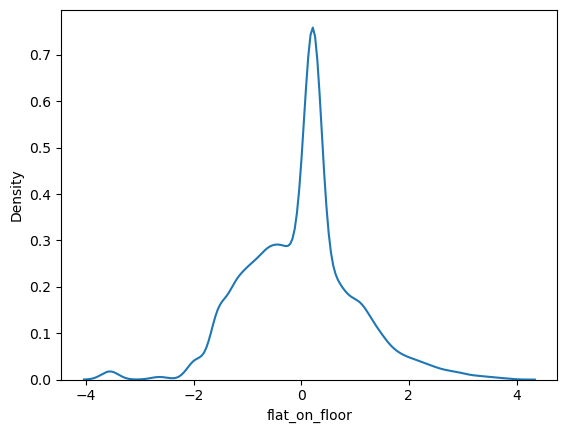

In [120]:
from sklearn.preprocessing import PowerTransformer

# Define pipeline
flat_on_floor_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')), #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning                                                                                     
])

# Fit transformer
flat_on_floor_transformer.fit(X_train.loc[:, ['flat_on_floor']])

# Get applied transform info
applied_transform = flat_on_floor_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = flat_on_floor_transformer.transform(X_train.loc[:, ['flat_on_floor']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['flat_on_floor'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['flat_on_floor'])
sns.kdeplot(imputed_df['flat_on_floor'])

In [130]:
skewness_value = X_train['total_floor'].skew()
skewness_value

1.1090226866993123

Transformation applied: power_transform


<Axes: xlabel='total_floor', ylabel='Density'>

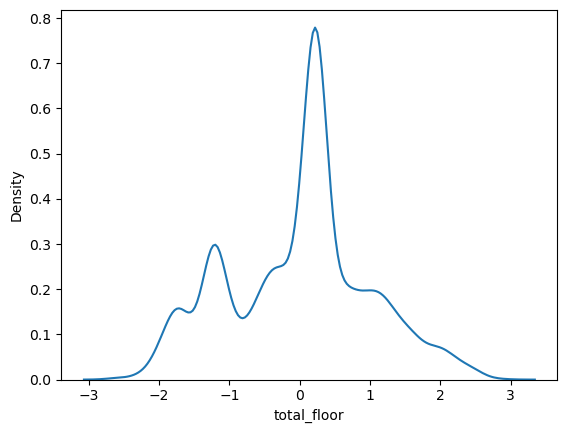

In [123]:
# Define pipeline
total_floor_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
total_floor_transformer.fit(X_train.loc[:, ['total_floor']])

# Get applied transform info
applied_transform = total_floor_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = total_floor_transformer.transform(X_train.loc[:, ['total_floor']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['total_floor'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['total_floor'])
sns.kdeplot(imputed_df['total_floor'])

Transformation applied: power_transform


<Axes: xlabel='lift', ylabel='Density'>

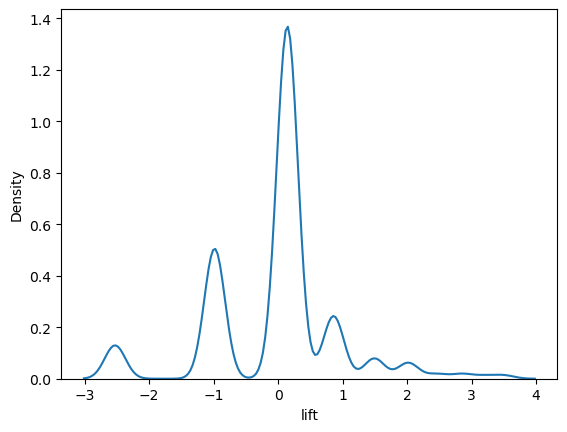

In [124]:
# Define pipeline
lift_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
lift_transformer.fit(X_train.loc[:, ['lift']])

# Get applied transform info
applied_transform = lift_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = lift_transformer.transform(X_train.loc[:, ['lift']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['lift'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['lift'])
sns.kdeplot(imputed_df['lift'])

Transformation applied: sqrt


<Axes: xlabel='bed', ylabel='Density'>

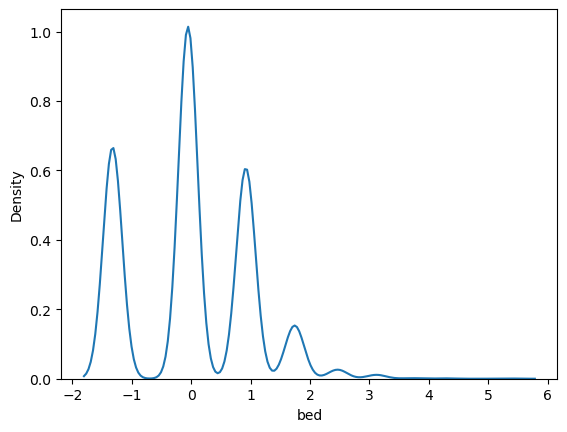

In [125]:
# Define pipeline
bed_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
bed_transformer.fit(X_train.loc[:, ['bed']])

# Get applied transform info
applied_transform = bed_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = bed_transformer.transform(X_train.loc[:, ['bed']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['bed'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['bed'])
sns.kdeplot(imputed_df['bed'])

Transformation applied: power_transform


<Axes: xlabel='bath', ylabel='Density'>

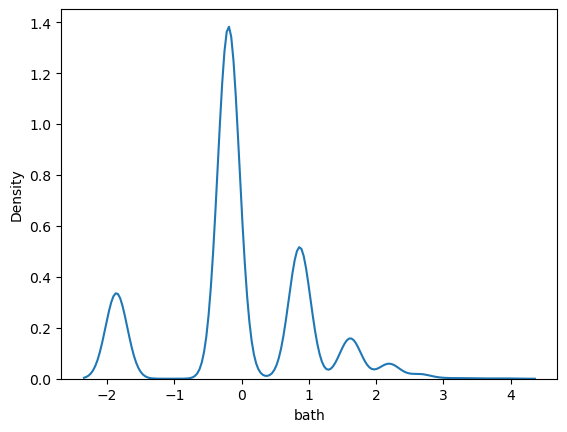

In [126]:
# Define pipeline
bath_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
bath_transformer.fit(X_train.loc[:, ['bath']])

# Get applied transform info
applied_transform = bath_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = bath_transformer.transform(X_train.loc[:, ['bath']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['bath'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['bath'])
sns.kdeplot(imputed_df['bath'])

Transformation applied: power_transform


<Axes: xlabel='balcony', ylabel='Density'>

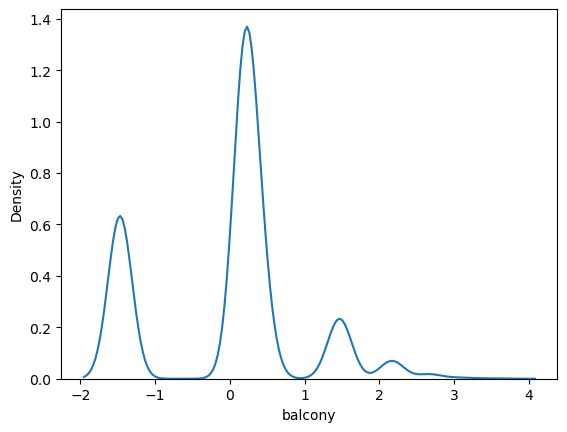

In [127]:
# Define pipeline
balcony_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
balcony_transformer.fit(X_train.loc[:, ['balcony']])

# Get applied transform info
applied_transform = balcony_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = balcony_transformer.transform(X_train.loc[:, ['balcony']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['balcony'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['balcony'])
sns.kdeplot(imputed_df['balcony'])

Transformation applied: power_transform


<Axes: xlabel='area', ylabel='Density'>

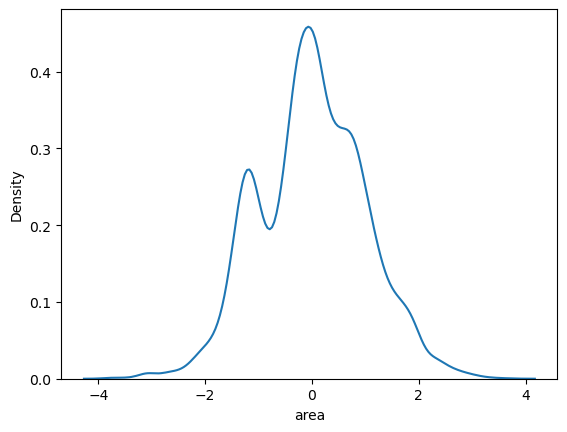

In [128]:
# Define pipeline
area_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
area_transformer.fit(X_train.loc[:, ['area']])

# Get applied transform info
applied_transform = area_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = area_transformer.transform(X_train.loc[:, ['area']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['area'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['area'])
sns.kdeplot(imputed_df['area'])

Transformation applied: power_transform


<Axes: xlabel='parking', ylabel='Density'>

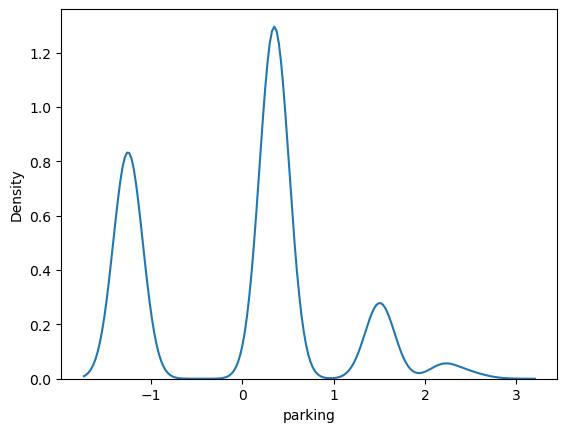

In [129]:
# Define pipeline
parking_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning 
])

# Fit transformer
parking_transformer.fit(X_train.loc[:, ['parking']])

# Get applied transform info
applied_transform = parking_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = parking_transformer.transform(X_train.loc[:, ['parking']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['parking'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['parking'])
sns.kdeplot(imputed_df['parking'])

In [131]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
print("-" * 100)
print(f'Total categorical columns: {len(categorical_columns)}')

Index(['id', 'builder', 'project_name', 'location', 'city', 'property_type',
       'property_status', 'property_age', 'ownership', 'furnish', 'flooring',
       'overlooking', 'extra_rooms', 'facing', 'education', 'transport',
       'shopping_centre', 'commercial_hub', 'hospital', 'tourist', 'seller',
       'amenities'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Total categorical columns: 22


In [ ]:
# Define pipeline
builder_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')), #parameter: use weights='distance' #startegy : use Iterative also
    ('skew_transform', SkewnessTransformer()),
    #('quantile_bin', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')), #<- this we have apply quantile binning and use strategy='kmeans' for kmeans binning
    ('scaler', FlexibleScaler(method='standard'))  # change method as needed(i.e use standard,maxabs,robust,minmax) and do not use this if apply above step i.e kmeans or quantile binning                                                                                     
])

# Fit transformer
builder_transformer.fit(X_train.loc[:, ['builder']])

# Get applied transform info
applied_transform = builder_transformer.named_steps['skew_transform'].applied_transform_
print("Transformation applied:", applied_transform)

# Transform data (returns numpy array)
imputed_array = builder_transformer.transform(X_train.loc[:, ['builder']])

# Convert back to DataFrame for easier handling & plotting
imputed_df = pd.DataFrame(imputed_array, columns=['builder'], index=X_train.index)
imputed_df
# Plot hist
#sns.histplot(imputed_df['builder'])
sns.kdeplot(imputed_df['builder'])